#  Introduction to Python

### part 13   OpenCV

- OpenCV（Open Source Computer Vision）是一個跨平台的電腦視覺庫，包含許多電腦視覺相關演算處理的Open Source Library，
   可用於開發即時的圖像處理、電腦視覺以及圖型識別程式。
   
- 被廣泛用於各個影像處理的領域，像是人臉識別、指紋辨識、道路偏移警示等研究領域
   
#### 2021/6/22

#### 參考資料

- https://opencv.org/
    
- https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_tutorials.html

- https://shengyu7697.github.io/python-tutorial/

- https://ithelp.ithome.com.tw/users/20120424/ironman/3642
        
- https://blog.gtwang.org/programming/opencv-basic-image-read-and-write-tutorial/

- https://kknews.cc/zh-tw/tech/3vj6ll3.html
            
- https://kknews.cc/zh-tw/code/gg2bej8.html
                
- https://github.com/grady1006/OpenCV-Python-Chinesse-Tutorials

- https://medium.com/@bob800530/opencv-python-%E5%AE%89%E8%A3%9D%E8%88%87%E7%B0%A1%E4%BB%8B-efe3ddd94c0b

- https://medium.com/@bob800530/opencv-tensorflow-%E9%81%93%E8%B7%AF%E5%81%8F%E7%A7%BB-%E7%89%A9%E4%BB%B6%E5%81%B5%E6%B8%AC%E5%BD%B1%E7%89%87%E8%BD%89%E8%BC%89-b424ec20b2ab

- https://yanwei-liu.medium.com/python%E5%BD%B1%E5%83%8F%E8%BE%A8%E8%AD%98%E7%AD%86%E8%A8%98-%E4%B8%89-open-cv%E6%93%8D%E4%BD%9C%E7%AD%86%E8%A8%98-1eab0b95339c

## 安裝

`conda install -c conda-forge opencv`


### 引入套件

`import cv2 `

## 圖片的大小計算與黑白、灰階

- 720p，就是格子有1280×720 格；1080p，格子有 1920x1080 格；4K是指4096x2160格。  
  每一格若是黑或白，稱此圖為「黑白」，每一格需要 1 bit 儲存。  
  而常使用的是「灰階」：圖片還是黑白的，但由最黑到最白之間可有256種明亮度。每一格 pixel 需要 8 bits (1 byte) 儲存。  
  所以 720p 的「灰階」圖片，一共有 1280×720x1 bytes = 921600 bytes = 921 KB (接近1MB)


- 電腦中圖片的大小計算 (全彩、常說的RGB)
  對於彩色圖片，而我們在圖像處理常使用的是「全彩」
  每個顏色有三個通道 (R、G、B)，每個通道以 8 bits (1 byte) 表示，也就是說，每一個 pixel 使用了 24 bits (3 bytes) 來表示，
  所以，最多可以有1677萬種顏色。
  一張720p 的「全彩」圖片，一共有 1280×720x3 bytes = 2764800 bytes = 2.7 MB


- 電腦中圖片的座標軸 (x, y):  
  在電腦中儲存的圖片，預設的座標軸都是在「第四象限」


## 讀取圖檔、顯示、輸出

- 讀取`cv2.imread()`  
  以 cv2.imread 讀進來的資料，會儲存成一個 NumPy 的陣列  
  此 NumPy 陣列的前兩個維度分別是圖片的高度與寬度，第三個維度則是圖片的 channel（RGB 彩色圖片的 channel 是 3，灰階圖片則為 1）

  讀取時的參數

    - `cv2.IMREAD_COLOR` : 以彩色圖片來讀取。會忽視圖片的透明度。此為預設值，這種格式會讀取 RGB 三個 channels 的彩色圖片，而忽略透明度的 channel  
    - `cv2.IMREAD_GRAYSCALE` : 以灰階的格式來讀取圖片  
    - `cv2.IMREAD_UNCHANGED` : 以Alpha合成來讀取圖片。讀取圖片中所有的 channels，包含透明度的 channel。


- 顯示`cv2.imshow()`  
  會另開一個視窗顯示圖片


- 輸出`cv2.imwrite()`

### 視窗控制

- `cv2.waitKey`

  函用來等待與讀取使用者按下的按鍵，而其參數是等待時間（單位為毫秒），當參數的數字為100時，會有100毫秒的時間可以輸入文字，經過100毫秒之後程式就會繼續執行。另外當參數設定為0的時候，會無限期地等待著使用者按下按鍵，之後才會繼續執行

- `cv2.destroyAllWindows()`則是將所有視窗都關閉的函數。

- `cv2.destroyWindow('Imagetest')`  關閉指定的視窗

In [ ]:
%matplotlib inline
import cv2 
import numpy as np 
import matplotlib.pyplot as plt

# 讀取圖檔
img = cv2.imread('./files/image.jpg')

print('(height, width, channel)=', img.shape)

# 顯示圖片
cv2.imshow('imagetest',img) #開啟視窗名稱 imagetest


# 按下任意鍵則關閉所有視窗
cv2.waitKey(0) 
cv2.destroyAllWindows()
#關閉 'Imagetest' 視窗
#cv2.destroyWindow('Imagetest')

In [ ]:
#調整視窗顯示大小
#在預設的狀況下，以 cv2.imshow 所開啟的視窗會依據圖片來自動調整大小，但若是圖片太大、要自由縮放視窗的大小，可用 cv2.namedWindow 
#將視窗設定為 cv2.WINDOW_NORMAL
%matplotlib inline
import cv2 
import numpy as np 
import matplotlib.pyplot as plt

# 讀取圖檔
img = cv2.imread('./files/image.jpg')

# 讓視窗可以自由縮放大小
cv2.namedWindow('imagetest', cv2.WINDOW_NORMAL)

cv2.imshow('imagetest', img)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [ ]:
#輸出圖檔

%matplotlib inline
import cv2 
import numpy as np 
import matplotlib.pyplot as plt

# 輸出圖檔，可透過圖片的副檔名來指定輸出的圖檔格式
cv2.imwrite('./files/output.jpg', img)
cv2.imwrite('./files/output.png', img)
cv2.imwrite('./files/output.tiff', img)

#輸出圖片檔案時，可以調整圖片的品質或壓縮率
# 設定 JPEG 圖片品質為 90（可用值為 0 ~ 100）
cv2.imwrite('output.jpg', img, [cv2.IMWRITE_JPEG_QUALITY, 90])

# 設定 PNG 壓縮層級為 5（可用值為 0 ~ 9）
cv2.imwrite('output.png', img, [cv2.IMWRITE_PNG_COMPRESSION, 5])

cv2.destroyAllWindows() 

## 用opencv讀取、用matplitlib顯示


透過 matplotlib 直接在 jupyter 中直接顯示圖片，除了開發快速(能直接顯示結果)之外，也能快速查找座標。  
要注意**一般的顏色通道通常為 RGB，但 OpenCV 中處理圖片的顏色通道為 BGR**

### 彩色圖：
  
  Matplotlib顯示圖片只要呼叫imshow就可以了，但是由於OpenCV讀取進來的圖片會以BGR的方式儲存三個顏色的channel，

  如果直接把OpenCV讀入的圖片放進Matplotlib顯示，會出現顏色錯誤問題，必須要先將作轉換BGR $\rightarrow$ RGB
  
  
### 灰階圖：

  以OpenCV讀取灰階的圖片時，由於channel只有一個，所以不會有色彩問題，直接把OpenCV讀入的NumPy陣列放進Matplotlib的imshow中即可顯示，
  但是 Matplotlib 在顯示一個channel的圖片時，會用預設的colormap上色，如果想要以黑白的方式呈現灰階圖片，要設定colormap為gray

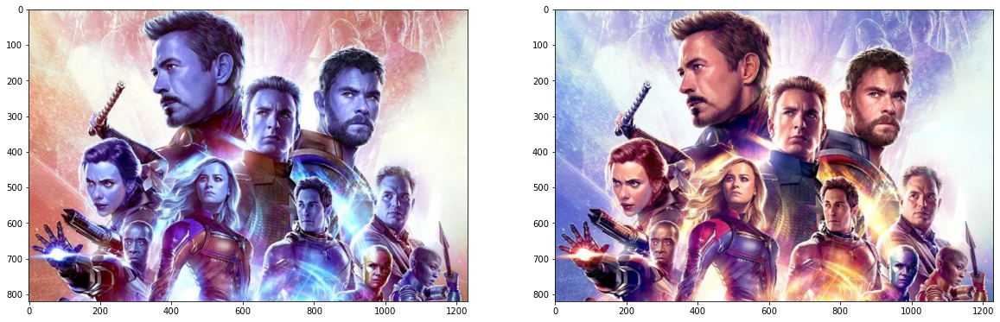

In [1]:
%matplotlib inline
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 使用 OpenCV 讀取圖檔
img_bgr = cv2.imread('./files/image.jpg')

# 將 BGR 圖片轉為 RGB 圖片
img_rgb = img_bgr[:,:,::-1]

# 或是
# img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

# 使用 Matplotlib 顯示圖片
plt.figure(figsize = (20, 20))
plt.subplot(1,2,1)
plt.imshow(img_bgr)
plt.subplot(1,2,2)
plt.imshow(img_rgb)
#plt.show()

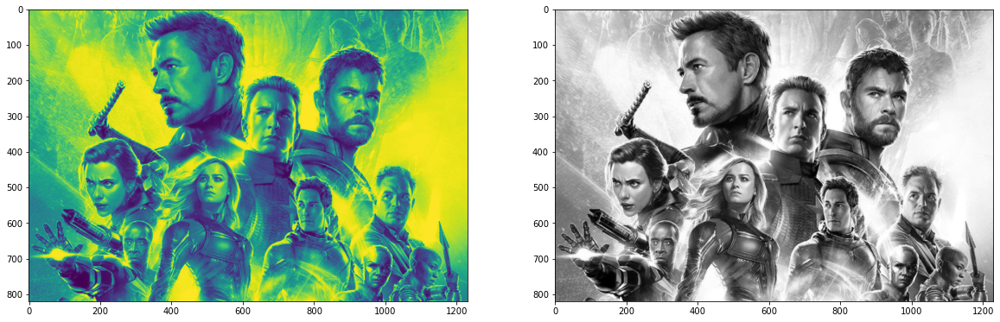

In [2]:
%matplotlib inline

import cv2
import numpy as np
import matplotlib.pyplot as plt

# 使用 OpenCV 讀取灰階圖檔
img_gray = cv2.imread('./files/image.jpg', cv2.IMREAD_GRAYSCALE)

# 使用 Matplotlib 顯示圖片
plt.figure(figsize = (20, 20))
plt.subplot(1,2,1)
plt.imshow(img_gray)
plt.subplot(1,2,2)
plt.imshow(img_gray, cmap = 'gray') 
#plt.show()


## RGB三色以灰階顯示

實際上，RGB圖像是由三個通道疊加而成的：R, G, B，所以把每個通道一個一個的描繪出來，就可以理解顏色通道是如何構成的了。

觀察下面的圖片，在R通道圖中，紅色飽和度高的部分看起來是白色的，這是由於紅色部分中的值接近255。

在灰度模式下，值越高顏色就越白。還可以使用G或B通道來檢查這一點，並比較某些部分之間的差異


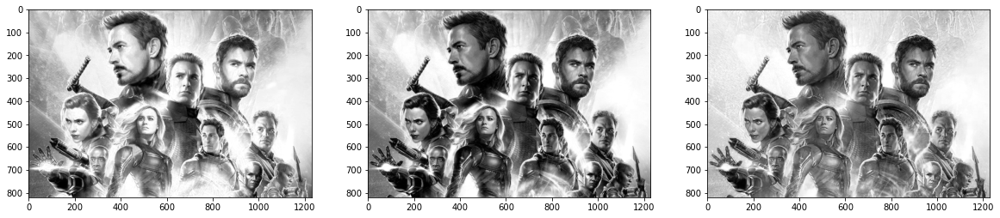

In [3]:
%matplotlib inline

import cv2
import numpy as np
import matplotlib.pyplot as plt


img_bgr = cv2.imread('./files/image.jpg')

img_rgb = img_bgr[:,:,::-1]

fig, axs = plt.subplots(nrows = 1, ncols = 3, figsize = (20, 20)) 

for i in range(0, 3): 
    ax = axs[i] 
    ax.imshow(img_rgb[:, :, i], cmap = 'gray')

#plt.show()

## 調整亮度

運用array的操作，可以對圖作亮度調整

如果是增加光線:數值往 255靠近 (更亮)
如果是減少光線:數值往   0靠近 (更暗)

範例：
- 調亮
$$
\sqrt{ori} \sqrt{255} \dfrac{\sqrt{\theta}}{\phi}
$$

公式化簡後，除了 phi、theta 能夠改變最終值外，
是讓原本的 origin 值開根號乘上根號255，所以會呈現凹口向下的曲線。

- 調暗
$$
\dfrac{{ori}^{2}}{255} \times \dfrac{{\theta}^2}{\phi}
$$
公式化簡後，除了 phi、theta能夠改變最終值外，
是讓原本的 origin 平方除以255，所以會呈現凹口向上的曲線。

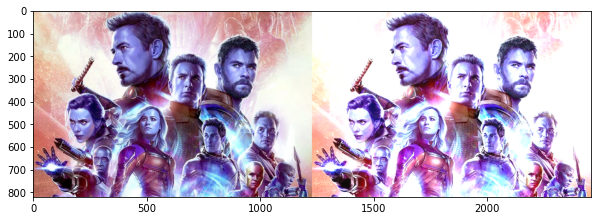

In [4]:
#調整亮度：線性調亮

%matplotlib inline

import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread('./files/image.jpg')
res = np.uint8(np.clip((1.5 * img + 10), 0, 255))  # 將img數值乘上1.5再加10，但是限制在0~255間，
                                                   # 並轉換為8位Unsigned integer (0 to 255)
tmp = np.hstack((img, res))  # 兩張圖片橫向合併（便於對比顯示）

#print(img, res, tmp)
plt.figure(figsize=(10,10))
plt.imshow(tmp)

(<matplotlib.image.AxesImage at 0x7fe3494f7a90>,
 Text(0.5, 1.0, 'Decrease intensity'))

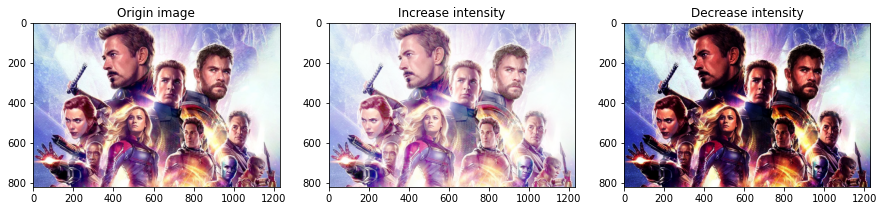

In [5]:
#調整亮度：依照上方範例

%matplotlib inline

import cv2
import numpy as np
import matplotlib.pyplot as plt


img_bgr = cv2.imread('./files/image.jpg')
img_rgb = img_bgr[:,:,::-1]

origin_img = img_rgb
    
maxIntensity = 255.0 # depends on dtype of image data
    
# Parameters for manipulating image data
phi = 1
theta = 1

# Increase intensity 
increase_img = (maxIntensity/phi)*(origin_img/(maxIntensity/theta))**0.5
increase_img = np.array(increase_img, dtype=np.uint8)
    


# Decrease intensity  
decrease_img = (maxIntensity/phi)*(origin_img/(maxIntensity/theta))**2
decrease_img = np.array(decrease_img, dtype=np.uint8)
   
    
plt.figure(figsize=(15,10))
plt.subplot(131)
plt.imshow(origin_img), plt.title('Origin image')

plt.subplot(132)
plt.imshow(increase_img), plt.title('Increase intensity')
           
plt.subplot(133)
plt.imshow(decrease_img), plt.title('Decrease intensity')

## HSV與 HLS

![](./images/HSV_HSL.jpg)

1. 正如在上圖看到的那樣，三維的表達，更類似於人類的感知方式。

- HSV代表色調(Hue)、飽和度(Saturation)和色值。  
- HSL代表色調(Hue)、飽和度(Saturation)和亮度(Lightness)。

HSV的中軸是色值，HSL的中軸是光量。沿著中心軸的角度，有色調和實際的顏色。與中心軸的距離屬於飽和度。



2. 將int範圍(0 ~ 255)的顏色表示轉換為浮點數(0 ~ 1)，這樣方便做比例上的運算。  
把最後的結果會寫為 1 + x/100.0，改變的lightness、saturation值都是對應x改變的% (正或負) 大小。  
避免運算結果超過範圍，我們在運算後，將所有超過1的值皆設為1。

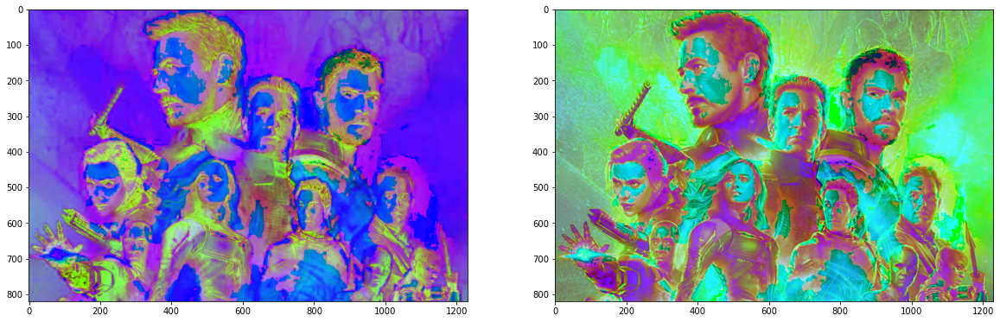

In [6]:
%matplotlib inline

import cv2
import numpy as np
import matplotlib.pyplot as plt


img = cv2.imread('./files/image.jpg')

# Transform the image into HSV and HLS models 
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV) 
img_hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS) 

# Plot the converted images 
fig, (ax1, ax2) = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 20)) 
ax1.imshow(img_hsv) 
ax2.imshow(img_hls) 
#plt.show()


(<matplotlib.image.AxesImage at 0x7fe34aafb1c0>,
 Text(0.5, 1.0, 'Increase saturation'))

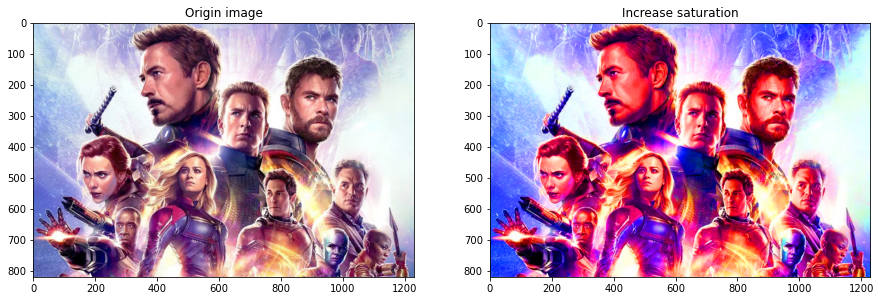

In [7]:
# 調整亮度、飽和度

%matplotlib inline
import cv2
import numpy as np
import matplotlib.pyplot as plt


img = cv2.imread('./files/image.jpg')
origin_img = img
    
# 圖像歸一化，且轉換為浮點型
fImg = img.astype(np.float32)
fImg = fImg / 255.0
    
# 顏色空間轉換 BGR -> HLS
hlsImg = cv2.cvtColor(fImg, cv2.COLOR_BGR2HLS)
hlsCopy = np.copy(hlsImg)

lightness = 0 # lightness 調整為  "1 +/- 幾 %"
saturation = 300 # saturation 調整為 "1 +/- 幾 %"
 
# 亮度調整
hlsCopy[:, :, 1] = (1 + lightness / 100.0) * hlsCopy[:, :, 1]
hlsCopy[:, :, 1][hlsCopy[:, :, 1] > 1] = 1  # 應該要介於 0~1，計算出來超過1 = 1

# 飽和度調整
hlsCopy[:, :, 2] = (1 + saturation / 100.0) * hlsCopy[:, :, 2]
hlsCopy[:, :, 2][hlsCopy[:, :, 2] > 1] = 1  # 應該要介於 0~1，計算出來超過1 = 1
    
# 顏色空間反轉換 HLS -> BGR 
result_img = cv2.cvtColor(hlsCopy, cv2.COLOR_HLS2BGR)
result_img = ((result_img * 255).astype(np.uint8))

plt.figure(figsize=(15,10))
plt.subplot(121)
plt.imshow(origin_img[:,:,::-1]), plt.title('Origin image')

plt.subplot(122)
plt.imshow(result_img[:,:,::-1]), plt.title('Increase saturation')

## 影像裁切

只需要知道座標後，決定要裁減的範圍即可。

(<matplotlib.image.AxesImage at 0x7fe3348f85b0>, Text(0.5, 1.0, 'croped img'))

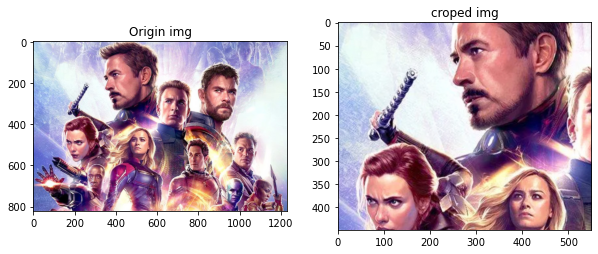

In [8]:
#裁切圖片

%matplotlib inline
import cv2
import numpy as np
import matplotlib.pyplot as plt


img = cv2.imread("./files/image.jpg")

# 裁切區域的 x 與 y 座標（左上角）
x = 100
y = 100

# 裁切區域的長度與寬度
w = 550
h = 450

# 裁切圖片
crop_img = img[y:y+h, x:x+w]


# 顯示圖片
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(img[:,:,::-1]), plt.title('Origin img')
plt.subplot(122)
plt.imshow(crop_img[:,:,::-1]), plt.title('croped img')

# 寫入圖檔
#cv2.imwrite('crop.jpg', crop_img)

## 改變圖片比例

https://shengyu7697.github.io/python-opencv-resize/

`cv2.resize(input_image_array, (width, height) , interpolation=cv2.INTER_AREA)` 

interpolation的選項：
- INTER_NEAREST :最近鄰插值，是最簡單的插值方法，且速度快，但也容易出現鋸齒的現象
- INTER_LINEAR	:雙線性插值（預設）
- INTER_AREA	:使用像素區域關係進行重採樣。它可能是圖像抽取的首選方法，因為它會產生無雲紋理(波紋)的結果。 但是當圖像縮放時，它類似於INTER_NEAREST方法。
- INTER_CUBIC	:4x4像素鄰域的雙三次插值
- INTER_LANCZOS4:8x8像素鄰域的Lanczos插值

如果是要縮小圖片的話，通常 INTER_AREA 使用效果較佳。
如果是要放大圖片的話，通常 INTER_CUBIC 使用效果較佳，次等則是 INTER_LINEAR。
如果要追求速度的話，通常使用 INTER_NEAREST。

Text(0.5, 1.0, 'Resized to 20%')

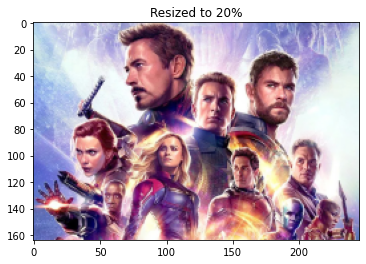

In [9]:
# 改變圖片比例：縮小

import cv2
import numpy as np

img = cv2.imread("./files/image.jpg")

scale_percent = 20 # percent of original size
width = int(img.shape[1] * scale_percent / 100)
height = int(img.shape[0] * scale_percent / 100)
dim = (width, height)  #寬,高

resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
plt.imshow(resized[:,:,::-1])
plt.title('Resized to 20%')


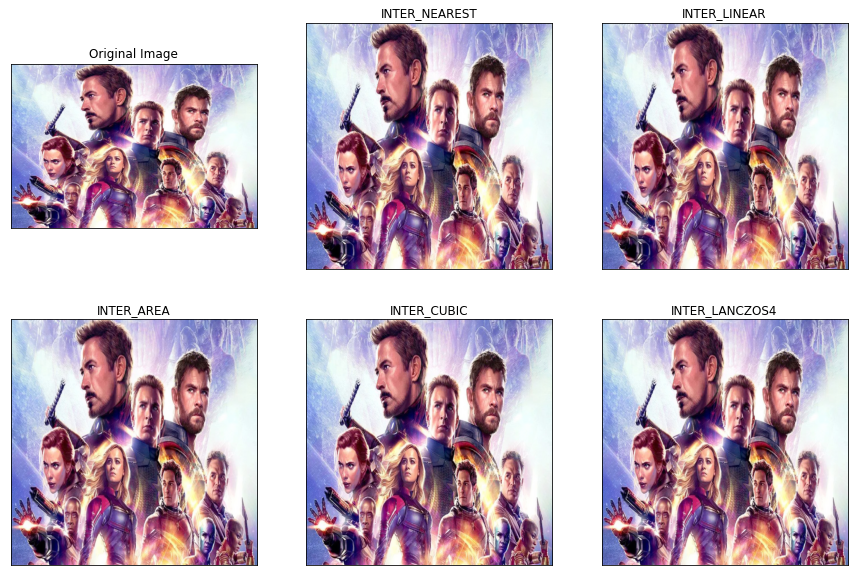

In [10]:
# 改變圖片比例：比較各種插值法

%matplotlib inline
import cv2
from matplotlib import pyplot as plt

image = cv2.imread('./files/image.jpg')

width, height = 800 , 800
img1 = cv2.resize(image, (width, height), interpolation=cv2.INTER_NEAREST)
img2 = cv2.resize(image, (width, height), interpolation=cv2.INTER_LINEAR)
img3 = cv2.resize(image, (width, height), interpolation=cv2.INTER_AREA)
img4 = cv2.resize(image, (width, height), interpolation=cv2.INTER_CUBIC)
img5 = cv2.resize(image, (width, height), interpolation=cv2.INTER_LANCZOS4)

#用matplotlib畫，顏色轉換詳見以下內容
# BGR 轉 RGB
img0_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2_rgb = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img3_rgb = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
img4_rgb = cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)
img5_rgb = cv2.cvtColor(img5, cv2.COLOR_BGR2RGB)

# 或這樣轉也可以
#img1_rgb = img1[:,:,::-1]

titles = ['Original Image', 'INTER_NEAREST', 'INTER_LINEAR', 'INTER_AREA', 'INTER_CUBIC', 'INTER_LANCZOS4']
images = [img0_rgb, img1_rgb, img2_rgb, img3_rgb, img4_rgb, img5_rgb]

plt.figure(figsize=(15,10))

for i in range(6):
    plt.subplot(2, 3, i+1)
    plt.imshow(images[i])
    plt.title(titles[i])
    plt.xticks([]), plt.yticks([])


## 調整色調(冷色系/暖色系)、色溫(白平衡)modify color temperature, white balance

冷、暖色調，其實就是色溫變化的結果，而色溫的變化，通常也就伴隨著「白平衡的破壞」。  
一個白平衡的圖片，色調並不會明顯偏冷或偏暖，但因為人類視覺上的觀感，有時我們能透過色調使圖片更有特色。

例如：  
- 想呈現「冷酷、冰冷」的照片，適合使用冷色調。
- 想呈現「溫暖、熱情」的照片，適合使用暖色調。

(<matplotlib.image.AxesImage at 0x7fe3351af490>, Text(0.5, 1.0, 'cold'))

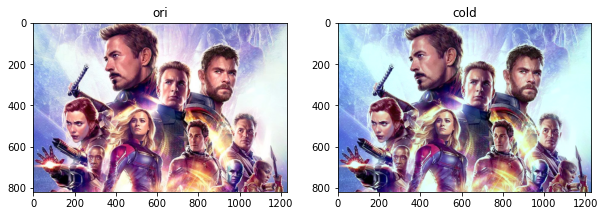

In [11]:
%matplotlib inline
import cv2
import numpy as np
import matplotlib.pyplot as plt


img = cv2.imread("./files/image.jpg")


# ---------------- 冷色調 ---------------- #  
    
#     height = img.shape[0]
#     width = img.shape[1]
#     dst = np.zeros(img.shape, img.dtype)

# 1.計算三個通道的平均值，並依照平均值調整色調
imgB = img[:, :, 0] 
imgG = img[:, :, 1]
imgR = img[:, :, 2] 

# 調整色調請調整這邊~~ 
    # 白平衡 -> 三個值變化相同
    # 冷色調(增加b分量) -> 除了b之外都增加
    # 暖色調(增加r分量) -> 除了r之外都增加
bAve = cv2.mean(imgB)[0] 
gAve = cv2.mean(imgG)[0] + 20
rAve = cv2.mean(imgR)[0] + 20
aveGray = (int)(bAve + gAve + rAve) / 3

# 2. 計算各通道增益係數，並使用此係數計算結果
bCoef = aveGray / bAve
gCoef = aveGray / gAve
rCoef = aveGray / rAve
imgB = np.floor((imgB * bCoef))  # 向下取整
imgG = np.floor((imgG * gCoef))
imgR = np.floor((imgR * rCoef))

# 3. 變換後處理
#     for i in range(0, height):
#         for j in range(0, width):
#             imgb = imgB[i, j]
#             imgg = imgG[i, j]
#             imgr = imgR[i, j]
#             if imgb > 255:
#                 imgb = 255
#             if imgg > 255:
#                 imgg = 255
#             if imgr > 255:
#                 imgr = 255
#             dst[i, j] = (imgb, imgg, imgr)

# 將原文第3部分的演算法做修改版，加快速度
imgb = imgB
imgb[imgb > 255] = 255
    
imgg = imgG
imgg[imgg > 255] = 255
    
imgr = imgR
imgr[imgr > 255] = 255
        
cold_rgb = np.dstack((imgb, imgg, imgr)).astype(np.uint8) 

plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(img[:,:,::-1]), plt.title('ori')
plt.subplot(122)
plt.imshow(cold_rgb[:,:,::-1]), plt.title('cold')


## 增加顆粒感 (增加高斯噪點) add gaussian noise

高斯噪聲大概長這樣(平均=0，標準差 = 0.1)：
(請注意：雖然是常態分佈，但值依然是隨機的，所以每次產生的結果都會不同！)
其實就是把噪聲到圖上加起來而已哈哈哈哈。
上面已經有標準差 = 0.1的結果，
我們下面換一個比較大一點的標準差 = 0.5的結果，我們看看有什麼樣的效果~~

(<matplotlib.image.AxesImage at 0x7fe333845130>, Text(0.5, 1.0, 'Result'))

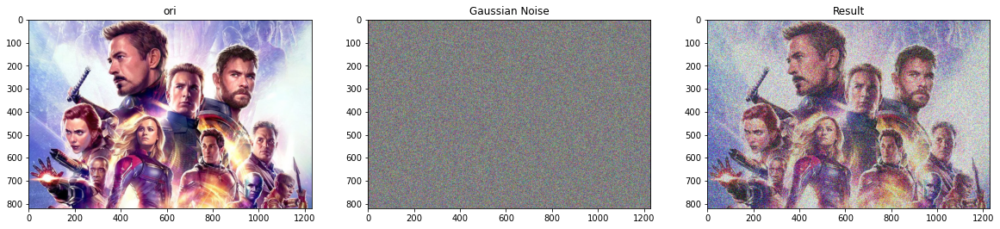

In [12]:
%matplotlib inline
import cv2
import numpy as np
import matplotlib.pyplot as plt


img = cv2.imread("./files/image.jpg")
    
# int -> float (標準化)
img = img / 255
    
# 隨機生成高斯 noise (float + float)
mean=0 
sigma=0.5
noise = np.random.normal(mean, sigma, img.shape)
    
# noise + 原圖
gaussian_out = img + noise
# 所有值必須介於 0~1 之間，超過1 = 1，小於0 = 0
gaussian_out = np.clip(gaussian_out, 0, 1)
    
# 原圖: float -> int (0~1 -> 0~255)
gaussian_out = np.uint8(gaussian_out*255)

# noise: float -> int (0~1 -> 0~255)
noise = np.uint8(noise*255)
    
plt.figure(figsize=(20,30))
plt.subplot(131)
plt.imshow(img[:,:,::-1]), plt.title('ori')
plt.subplot(132)
plt.imshow(noise[:,:,::-1]), plt.title('Gaussian Noise')
plt.subplot(133)
plt.imshow(gaussian_out[:,:,::-1]), plt.title('Result')



## 改變圖片的對比度 modify contrast 

- 增加對比度: 白的更白，黑的更黑
- 減少對比度: 白黑都接近灰，分不清楚


增加對比度 - 網路上常見的方法 (但沒有實現黑的更黑這件事): 


(<matplotlib.image.AxesImage at 0x7fe333ed4580>, Text(0.5, 1.0, 'mod'))

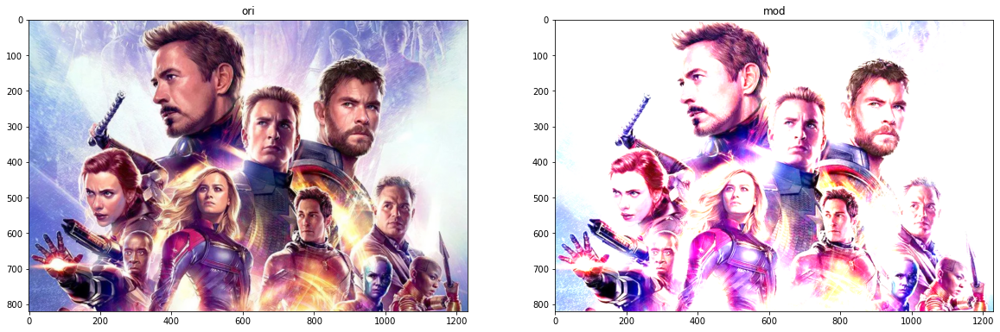

In [13]:
# modify_contrast_and_brightness(img):
# 公式： Out_img = alpha*(In_img) + beta
# alpha: alpha參數 (>0)，表示放大的倍数 (通常介於 0.0 ~ 3.0之間)，能夠反應對比度
# a>1時，影象對比度被放大， 0<a<1時 影象對比度被縮小。
# beta:  beta参数，用來調節亮度
# 常數項 beta 用於調節亮度，b>0 時亮度增強，b<0 時亮度降低。
  
%matplotlib inline
import cv2
import numpy as np
import matplotlib.pyplot as plt


img = cv2.imread("./files/image.jpg")
img_o = img     
    
array_alpha = np.array([2.0]) # contrast 
array_beta = np.array([0.0]) # brightness

# add a beta value to every pixel 
img = cv2.add(img, array_beta)                    

# multiply every pixel value by alpha
img = cv2.multiply(img, array_alpha)
    
# 所有值必須介於 0~255 之間，超過255 = 255，小於 0 = 0
img = np.clip(img, 0, 255)

print("增加對比度 - 網路上常見的方法 (但沒有實現黑的更黑這件事): ")
  
    
plt.figure(figsize=(20,30))
plt.subplot(121)
plt.imshow(img_o[:,:,::-1]), plt.title('ori')
plt.subplot(122)
plt.imshow(img[:,:,::-1]), plt.title('mod')    

### 問題
上面的方法是乘上某一個alpha值，使分佈被放大，再進行縮小，這樣能讓越大的數字(接近255)，被放的更大(超過255後，被計算為255)，
也就是說「白的更白」實現了。  
但「黑的更黑」呢? 上面公式就是出現了這樣的問題，越接近0的值，透過上面的公式沒有辦法更接近0，
甚至反而因為放大效果，離0更遠了。這樣就不太符合增加對比度的意義了，


### 修改版

運用三角函數的特性，

$ c = \dfrac{contrast}{255.0} $，contrast = (-255, +255)，代表 c = (-1, +1)

$k = \tan \dfrac{45 + 44 * c}{180\pi}$，將 $c$ 代入，得到約 $\tan\dfrac{(1:89)}{180\pi}$，

tan的特性：
- tan > 45度: y>x，為分數 (0~1)，表示更接近0
- tan < 45度: x>y，為假分數 (>1)，表示更遠離0

取
`img = (img - 127.5 * (1 - B)) * k + 127.5 * (1 + B)`

255的一半為127.5，後面127.5是正的，前面127.5是負的，因為乘上k，k可以決定要更大的負(整個式子結果更負)或更小的負(整個式子結果更正)。  
因為我們是從中間 127.5 開始切，所以就會有小於127.5 往更負的方向跑，大於127.5 往更正的方向跑的現象。  
但隨著值越大，一定會超出 0 ~ 255 的顏色範圍，所以最後我們用：

`img = np.clip(img, 0, 255).astype(np.uint8)`

所有值必須介於 0~255 之間，超過255 = 255，小於 0 = 0

減少對比度 (白黑都接近灰，分不清楚): 


(<matplotlib.image.AxesImage at 0x7fe3234b87c0>, Text(0.5, 1.0, 'mod'))

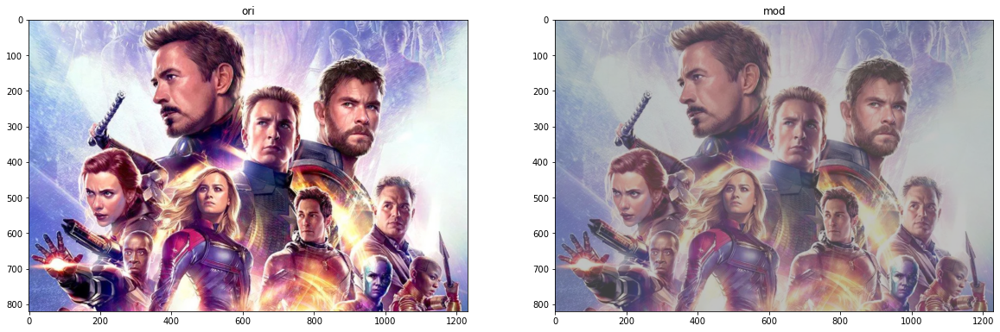

In [15]:
#modify_contrast_and_brightness2(img, brightness=0 , contrast=100):
# 上面做法的問題：有做到對比增強，白的的確更白了。
# 但沒有實現「黑的更黑」的效果
%matplotlib inline
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math
    
brightness = 0
contrast = -100 # - 減少對比度/+ 增加對比度

B = brightness / 255.0
c = contrast / 255.0 
k = math.tan((45 + 44 * c) / 180 * math.pi)

img = cv2.imread("./files/image.jpg")
img_o = img


img = (img - 127.5 * (1 - B)) * k + 127.5 * (1 + B)
      
# 所有值必須介於 0~255 之間，超過255 = 255，小於 0 = 0
img = np.clip(img, 0, 255).astype(np.uint8)

print("減少對比度 (白黑都接近灰，分不清楚): ")


plt.figure(figsize=(20,30))
plt.subplot(121)
plt.imshow(img_o[:,:,::-1]), plt.title('ori')
plt.subplot(122)
plt.imshow(img[:,:,::-1]), plt.title('mod')  

## 顯示圖片直方圖、分離與合併RGB通道 show histogram, split, merge RGB channel


- 分離RGB三通道  
   使用 `cv2.split` 的方式
   有些時候我們在進階修圖會針對單一通道的顏色進行調整，此時分離GRB三個通道就是非常重要的技術了

- 合併RGB三通道
   `cv2.merge([B, G, R])`  
    修圖會先分離RGB三通道，進行各自顏色通道的調整後，最後合併RGB三通道，完成我們的修圖。


- 圖片直方圖
  `cv2.calcHist([img],[idx],None,[256],[0, 256])`

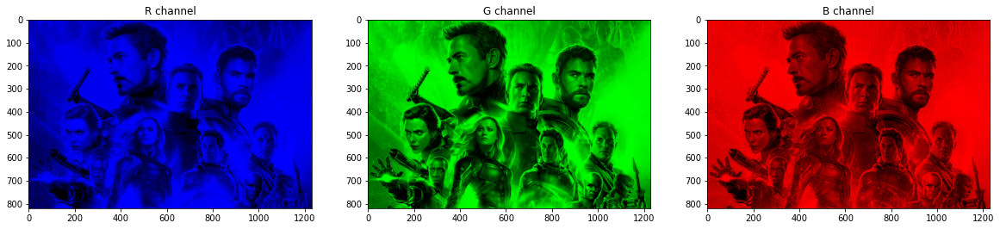

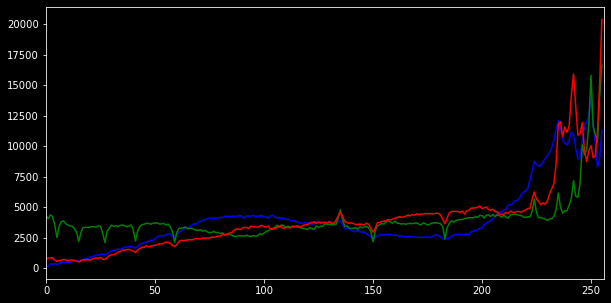

In [16]:
# split_RGBThreeChannel(img)
  
%matplotlib inline
import cv2
import numpy as np
import matplotlib.pyplot as plt


img = cv2.imread("./files/image.jpg")

(B, G, R) = cv2.split(img) # 3 channel
    
# make all zeros channel
zeros = np.zeros(img.shape[:2], dtype = np.uint8)

def merge_RGBThreeChannel(R, G, B):
    return cv2.merge([B, G, R])   
    

R_img = merge_RGBThreeChannel(R=R, G=zeros, B=zeros)
G_img = merge_RGBThreeChannel(R=zeros, G=G, B=zeros)   
B_img = merge_RGBThreeChannel(R=zeros, G=zeros, B=B)
    

plt.figure(figsize=(20,30))
plt.subplot(131)
plt.imshow(R_img), plt.title('R channel')
plt.subplot(132)
plt.imshow(G_img), plt.title('G channel') 
plt.subplot(133)
plt.imshow(B_img), plt.title('B channel') 




# show_histogram(img)
# 畫出 RGB 三種顏色的分佈圖
color = ('b','g','r')
plt.style.use('dark_background')
plt.figure(figsize=(10,5))
for idx, color in enumerate(color):
    histogram = cv2.calcHist([img],[idx],None,[256],[0, 256])
    plt.plot(histogram, color = color)
    plt.xlim([0, 256])
    


# 旋轉、平移、鏡射與透射 

https://www.jianshu.com/p/ef67cacf442c

- 翻轉 `cv2.flip()` 
- 仿射 `cv2.warpAffine()`
- 旋轉matrix `cv2.getRotationMatrix2D()`
- 取得圖像仿射matrix `cv2.GetAffineTransform(src, dst, mapMatrix)`
- 取得圖像透視的四個起點值 `cv2.getPerspectiveTransform(src, dst)`
- 圖像透視 `cv2.warpPerspective()`


### 翻轉
`cv2.flip(src, flipCode)`
   - src:原始圖陣列
   - flipcode為int 
     - 垂直方向翻轉(以x軸為軸翻轉):0 
     - 水平方向翻轉(以y軸為軸翻轉):1
     - 先以x軸翻轉、再以y軸翻轉，相當於旋轉180度:-1
      

Text(0.5, 1.0, 'h_v flip')

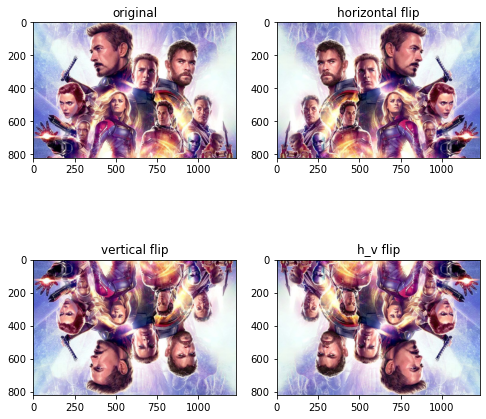

In [1]:
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
import cv2

image = cv2.imread("./files/image.jpg")

h_flip = cv2.flip(image, 1) # Flipped Horizontally 水平翻轉
v_flip = cv2.flip(image, 0) # Flipped Vertically 垂直翻轉
hv_flip = cv2.flip(image, -1) # Flipped Horizontally & Vertically 水平垂直翻轉


plt.figure(figsize=(8,8))

plt.subplot(221)
plt.imshow(image[:,:,::-1])
plt.title('original')

plt.subplot(222)
plt.imshow(h_flip[:,:,::-1])
plt.title('horizontal flip')

plt.subplot(223)
plt.imshow(v_flip[:,:,::-1])
plt.title('vertical flip')

plt.subplot(224)
plt.imshow(hv_flip[:,:,::-1])
plt.title('h_v flip')

# 調整圖的間距
# plt.subplots_adjust(wspace=0.5, hspace=0.1)
#plt.subplots_adjust(top=0.8, bottom=0.08, left=0.10, right=0.95, hspace=0,
#                    wspace=0.35)

#plt.show()

### 平移

- transformation matrix M :
$
M =
\left[
\begin{array}\\
1 &0 &t_x \\
0 &1 &t_y \\
\end{array}
\right]
$
沿x方向平移tx，沿y方向平移ty。

- 將matrixe改為float型態，傳入warpAffine()內：
  
`warpAffine(InputArray src, OutputArray dst, InputArray M, Size dsize, int flags=INTER_LINEAR, int borderMode=BORDER_CONSTANT, const Scalar& borderValue=Scalar())`
  
  - src :原始圖陣列
  - dst :轉換後圖陣列，與src相同大小、相同型態
  - M   : 2×3 transformation matrix，為浮點數
  - dsize:   輸出影像大小
  - flags:   combination of interpolation methods and the optional flag WARP_INVERSE_MAP that means that M is the inverse transformation ( dst→src ).
  - borderMode:  pixel extrapolation method (see BorderTypes); when borderMode=BORDER_TRANSPARENT, it means that the pixels in the destination image corresponding to the "outliers" in the source image are not modified by the function.
  - borderValue: value used in case of a constant border; by default, it is 0.



Text(0.5, 1.0, 'Translation')

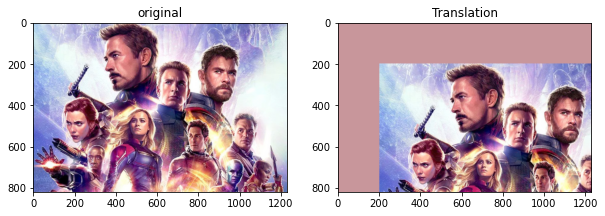

In [2]:
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
import cv2

img = cv2.imread('./files/image.jpg')
#rows, cols , channels = img.shape
rows, cols = img.shape[:2]


# 定義2*3矩陣平移矩陣，為numpy float32類型
# x軸平移tx，y軸平移ty
tx = 200
ty = 200
M = np.float32([[1,0,tx], [0,1,ty]])

M_img = cv2.warpAffine(img, M, (cols, rows), borderValue=(155, 150, 200))

plt.figure(figsize=(10,10))

plt.subplot(121)
plt.imshow(img[:,:,::-1])
plt.title('original')

plt.subplot(122)
plt.imshow(M_img[:,:,::-1])
plt.title('Translation')

### 旋轉指定角度

- 定義旋轉矩陣：  `M = cv2.getRotationMatrix2D(center, angle, scale)` 

   - center:圖的旋轉中心
   - angle: 旋轉角度（單位為度°，順時針為負，逆時針為正。180表示轉180度）
   - scale: 縮放比例（0.5表示，縮小為一半）
   
- 把旋轉矩陣傳入cv2.warpAffine()內

  `rotated_img = cv2.warpAffine(src, M, (width, height))`

Text(0.5, 1.0, '+45 degree Rotation ')

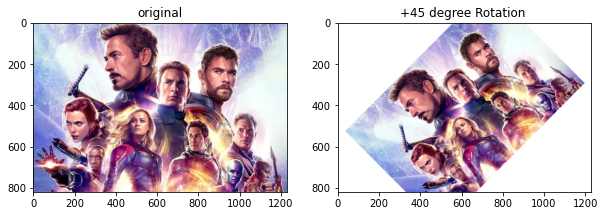

In [3]:
# 旋轉指定角度
import cv2
from matplotlib import pyplot as plt

image = cv2.imread('./files/image.jpg')

(h, w, d) = image.shape
center = (w / 2, h / 2)

#M:對中心逆時針旋轉45度，縮放為0.8
M = cv2.getRotationMatrix2D(center, 45, 0.8)
rotated = cv2.warpAffine(image, M, (w, h),  borderValue=(255, 255, 255))

plt.figure(figsize=(10,10))

plt.subplot(121)
plt.imshow(image[:,:,::-1])
plt.title('original')

plt.subplot(122)
plt.imshow(rotated[:,:,::-1])
plt.title('+45 degree Rotation ')

### 仿射

- 圖像的伸縮＋旋轉
- 給定轉換矩陣即可變換，但是此矩陣不易直接給定，所以opencv會根據變換前、後的三個點尋找變換矩陣。

   `M = cv2.getAffineTransform(pos1,pos2)` 得2×3矩陣，再傳入cv2.warpAffine()


(<AxesSubplot:title={'center':'Output'}>,
 Text(0.5, 1.0, 'Output'))

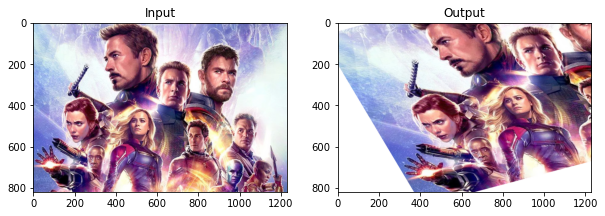

In [4]:
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
import cv2

img = cv2.imread('./files/image.jpg')
rows, cols ,ch = img.shape
pts1 = np.float32([[50,50],[200,50],[50,200]])   #原圖中的三個點座標
pts2 = np.float32([[10,100],[200,50],[100,250]]) #新圖中的三個點座標

M = cv2.getAffineTransform(pts1, pts2)            #取得新舊圖中的轉換矩陣

dst = cv2.warpAffine(img , M ,(cols,rows), borderValue=(255, 255, 255))

plt.figure(figsize=(10,10))
plt.subplot(121), plt.imshow(img[:,:,::-1]), plt.title('Input')
plt.subplot(122), plt.imshow(dst[:,:,::-1]), plt.title('Output')


### 透視　Perspective

- 視角變換，變換前後保持直線依然是直線
- 需要3×3矩陣，由原圖像中的4個點對應輸出圖像的4個點，但是4個點中的任3點不能共線，求出轉換矩陣，再傳入透視轉換函式

`M = cv2.getPerspectiveTransform(pos1,pos2)`

`cv2.warpPerspective(src, M, (widths, heights))`


(<AxesSubplot:title={'center':'Output'}>,
 Text(0.5, 1.0, 'Output'))

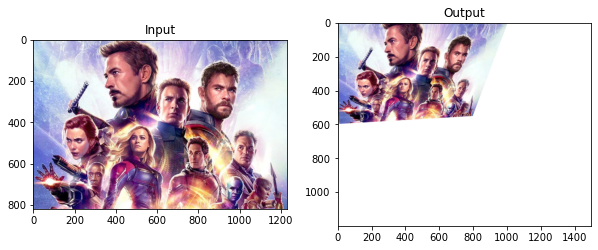

In [5]:
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
import cv2

img = cv2.imread('./files/image.jpg')
rows, cols, ch = img.shape

pts1 = np.float32([[56,65],[368,52],[28,387],[389,390]]) #原圖中的4個點座標
pts2 = np.float32([[0,0],[300,0],[0,300],[300,300]])     #新圖中的4個點座標

M = cv2.getPerspectiveTransform(pts1, pts2)

dst = cv2.warpPerspective(img, M, (1500,1200), borderValue=(255, 255, 255))

plt.figure(figsize=(10,10))
plt.subplot(121), plt.imshow(img[:,:,::-1]), plt.title('Input')
plt.subplot(122), plt.imshow(dst[:,:,::-1]), plt.title('Output')


## 建立全黑、全白空白圖

先定義好要的圖片大小。如果要彩色的圖片，維度需要設3 (才有RGB通道)，
照我們設定的圖片大小，將全部數值定為0，形成全黑圖；把數值全定為255，形成全白圖。

#### 建立全黑的新圖片 100*100
`shape = (100, 100, 3) # y, x, RGB
origin_img = np.zeros(shape, np.uint8)`

#### 建立全白的新圖片 100*100
`shape = (100, 100, 3) # y, x, RGB`  

`#第一種方法，直接建立全白圖片 100*100
origin_img = np.full(shape, 255).astype(np.uint8)`

`#第二種方法，一樣先建立全黑的圖片，再將全部用白色填滿。
origin_img = np.zeros(shape, np.uint8)
origin_img.fill(255)`

# 在圖像內畫圖

- 直線：`cv2.line()` 
- 圓形：`cv2.circle()`
- 矩形：`cv2.rectangle()`
- 橢圓：`cv2.ellipse() `
- 多邊形：`cv2.polylines()`

### 直線
`cv2.line(src, pt1, pt2, color, thickness, lineType)`

- pt1:起點座標 (x, y) 
- pt2:終點座標 (x, y) 
- color：顏色BGR(255,255,255)
- thickness:線寬，預設為1
- lineType:線種類


(<AxesSubplot:title={'center':'Lines'}>,
 Text(0.5, 1.0, 'Lines'))

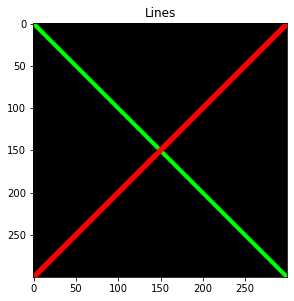

In [6]:
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
import cv2

#img = cv2.imread('image.jpg')
# 生成 300 × 300， np.zeros()預設是float64， 所以指定dtype為uint8
img = np.zeros((300, 300, 3), dtype="uint8") #建立全黑圖片
rows, cols, ch = img.shape

pt1 = (0,0)         #綠線
pt2 = (300, 300)
green = (0, 255, 0)

ptr1 = (0, 300)    #紅線
ptr2 = (300, 0)
red = (0,0, 255)

cv2.line(img, pt1, pt2, green, 3)
cv2.line(img, ptr1, ptr2, red, 5)

plt.figure(figsize=(10,10))
plt.subplot(121), plt.imshow(img[:,:,::-1]), plt.title('Lines')


### 圓形

`cv2.circle(src, center, radius, color, thickness, lineType)`

- center:圓心座標
- radius:半徑
- color:颜色
- thickness:線寬，預設為1，-1表示填滿封閉曲線


Text(0.5, 1.0, 'Filled_circle')

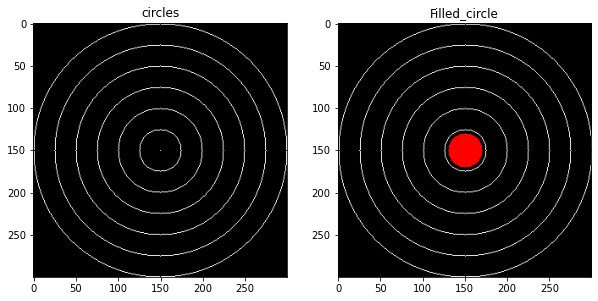

In [7]:
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
import cv2

img = np.zeros((300, 300, 3), dtype = "uint8")
rows, cols, ch = img.shape

(center_x, center_y) = (cols//2, rows//2) #圓心座標

white = (255, 255, 255)

# 畫出同心圓
for r in range(0, 175, 25):
    cv2.circle(img, (center_x, center_y), r, white)

plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(img)
plt.title('circles')


# 畫實心圓实，red=(255,0,0)
red = (255, 0, 0)
cv2.circle(img, (center_x, center_y), 20, red, -1)
plt.subplot(122)
plt.imshow(img)
plt.title('Filled_circle')


#### 矩形

`cv2.rectangle(src, left_up, right_down, color, thickness, lineType)`


- left_up :左上頂點座標 (x, y) 
- right_down:右下頂點座標 (x, y) 
- color：顏色BGR(255,255,255)
- thickness:線寬，預設為1(-1 表示填滿)
- lineType:線種類

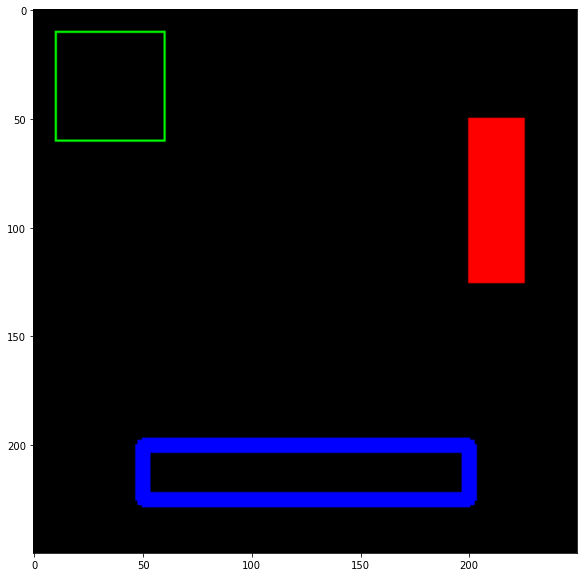

In [8]:
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
import cv2

img = np.zeros((250, 250, 3), dtype = "uint8")
rows, cols, ch = img.shape

green = (0,255,0)
cv2.rectangle(img, (10, 10), (60, 60), green) 
plt.figure(figsize=(10,10))
plt.imshow(img) 


red = (0,0,255)
cv2.rectangle(img, (50, 200), (200, 225), red, 5)
plt.imshow(img)

blue = (255, 0, 0)
cv2.rectangle(img, (200, 50), (225, 125), blue, -1) 
plt.imshow(img) 


### 橢圓

`cv2.ellipse(img, center, axes, rotateangle, startAngle, endAngle, color, thickness)`

- center：橢圓中心(x,y)
- axes：橢圓的半長軸與半短軸的大小
- rotateangle：橢圓旋轉角度，順時針為正
- startAngle：橢圓弧起始角度
- endAngle：橢圓弧度終止角度  (180表示只畫一半)
- color: 顏色
- thickness 橢圓的線條粗細 (-1 表示填滿)

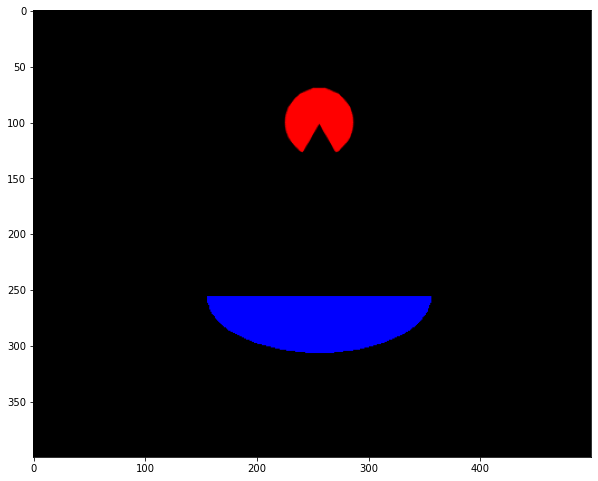

In [9]:
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
import cv2

img = np.zeros((400, 500, 3), dtype = "uint8")
rows, cols, ch = img.shape

center = (256,256)
axes = (100, 50)
rotateangle = 0
startAngle = 0
endAngle = 180
color =(255,0,0)
thickness = -1

#
cv2.ellipse(img, center, axes, rotateangle, startAngle, endAngle, color, thickness)
cv2.ellipse(img, (256, 100), (30, 30), 120, 0, 300, (0, 0, 255), -1, cv2.LINE_AA)
#cv2.circle(img, (256, 100), 10, (255, 0, 0), -1, cv2.LINE_AA)


plt.figure(figsize=(10,10))
plt.imshow(img[:,:,::-1])


###  多邊形

`cv2.polylines(img, pts, isClosed, color, thickness, lineType)`

- 指定多邊形的頂點座標，從第1個點畫至第2個點...
- isClosed: 是否閉合

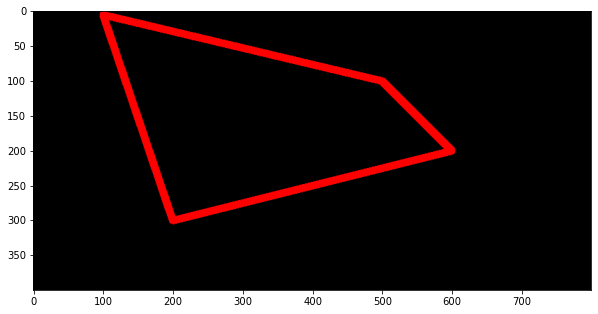

In [10]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import cv2


img = np.zeros((400, 800, 3), dtype = "uint8")
rows, cols, ch = img.shape

# 4個頂點
pts = np.array([[100, 5],  [500, 100], [600, 200], [200, 300]], np.int32)

# 頂點為4*1*2維
pts = pts.reshape((-1, 1, 2))
cv2.polylines(img, [pts], True, (0, 0, 255), 10)

plt.figure(figsize=(10,10))
plt.imshow(img[:,:,::-1])


# 加文字

`cv2.putText(img, text, org, fontFace, fontScale, color, thickness, lineType)`


- text:要顯示的文字
- org:文字的起始座標（左下角為起點）
- FontFace:字型，cv2. FONT_HERSHEY_SIMPLEX, FONT_HERSHEY_PLAIN, FONT_HERSHEY_DUPLEX, FONT_HERSHEY_COMPLEX, FONT_HERSHEY_TRIPLEX, FONT_HERSHEY_COMPLEX_SMALL, FONT_HERSHEY_SCRIPT_SIMPLEX, or FONT_HERSHEY_SCRIPT_COMPLEX, where each of the font ID’s can be combined with FONT_ITALIC to get the slanted letters.
- FontScale:字體大小
- lineType = cv2.LINE_AA 線條種類

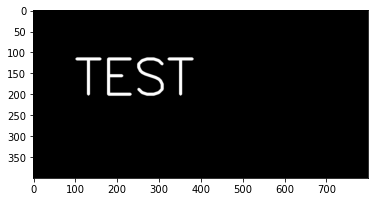

In [11]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import cv2


img = np.zeros((400, 800, 3), dtype = "uint8")
rows, cols, ch = img.shape

font = cv2.FONT_HERSHEY_SIMPLEX
cv2.putText(img, 'TEST', (100, 200), font,
            4, (255, 255, 255), 5, lineType=cv2.LINE_AA)

plt.imshow(img[:,:,::-1])

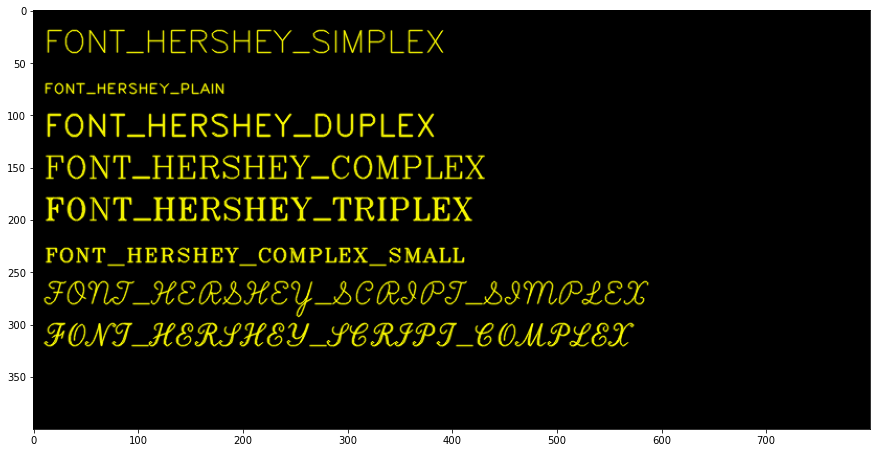

In [12]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import cv2


img = np.zeros((400, 800, 3), dtype = "uint8")
rows, cols, ch = img.shape

text = "FONT_HERSHEY_SIMPLEX"
position = (10, 40)
font = cv2.FONT_HERSHEY_SIMPLEX
size = 1
color = (0, 255, 255)
thickness = 1
lineType =  cv2.LINE_AA

cv2.putText(img, text, position, font, size, color, thickness, lineType)
    
cv2.putText(img, "FONT_HERSHEY_PLAIN", (10, 80), cv2.FONT_HERSHEY_PLAIN,
        1, (0, 255, 255), 1, cv2.LINE_AA)

cv2.putText(img, "FONT_HERSHEY_DUPLEX", (10, 120), cv2.FONT_HERSHEY_DUPLEX,
        1, (0, 255, 255), 1, cv2.LINE_AA)

cv2.putText(img, "FONT_HERSHEY_COMPLEX", (10, 160), cv2.FONT_HERSHEY_COMPLEX,
        1, (0, 255, 255), 1, cv2.LINE_AA)

cv2.putText(img, "FONT_HERSHEY_TRIPLEX", (10, 200), cv2.FONT_HERSHEY_TRIPLEX,
        1, (0, 255, 255), 1, cv2.LINE_AA)

cv2.putText(img, "FONT_HERSHEY_COMPLEX_SMALL", (10, 240), cv2.FONT_HERSHEY_COMPLEX_SMALL,
        1, (0, 255, 255), 1, cv2.LINE_AA)

cv2.putText(img, "FONT_HERSHEY_SCRIPT_SIMPLEX", (10, 280), cv2.FONT_HERSHEY_SCRIPT_SIMPLEX,
        1, (0, 255, 255), 1, cv2.LINE_AA)

cv2.putText(img, "FONT_HERSHEY_SCRIPT_COMPLEX", (10, 320), cv2.FONT_HERSHEY_SCRIPT_COMPLEX,
        1, (0, 255, 255), 1, cv2.LINE_AA)

plt.figure(figsize=(15,10))
plt.imshow(img[:,:,::-1])

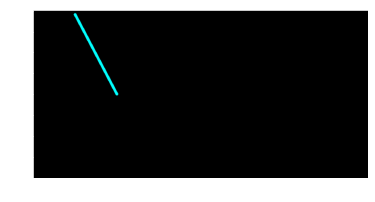

In [29]:
#畫圖形、加文字

%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import cv2

IMG = np.zeros((400, 800, 3), dtype = "uint8")
#rows, cols, ch = img.shape

#def drawing_shapes(img_path, type):
    #img = cv2.imread(img_path)
    
def drawing_shapes(img, type):
    
    if  type =='line':
        cv2.line(img,(100,10),(200,200),(255,255,0),5)
    if  type =='rectangle':
        cv2.rectangle(img,(100,10),(200,200),(255,255,0),5)
    if  type =='circle':
        cv2.circle(img,(180,170),45,(100,100,100),-1)
    if  type =='ellipse':
        cv2.ellipse(img,(256,256),(100,50),0,0,90,255,0)
    if  type =='polylines':
        pts = np.array([[10,5],[20,30],[70,20],[50,10]], np.int32)
        pts = pts.reshape((-1,1,2))
        cv2.polylines(img,[pts],True,(0,0,255))

    plt.imshow(img[:,:,::-1])
    
    
#def add_text(img_path, texts):
    #img=cv2.imread(img_path)
def add_text(img, texts):
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(img,texts,(350,80),font,2,(255,0,0),2,cv2.LINE_AA)
    plt.imshow(img)
   
    
drawing_shapes(IMG, 'line')    


In [ ]:
#調色盤
%matplotlib inline

import cv2
import numpy as np
import matplotlib.pyplot as plt


img = np.zeros((300,512,3), np.uint8)
cv2.namedWindow('image')
#RGB 顏色調整軸0~255

cv2.createTrackbar('R','image',0,255,nothing)
cv2.createTrackbar('G','image',0,255,nothing)
cv2.createTrackbar('B','image',0,255,nothing)
    
#顯示開關調色結果
switch = '0 : OFF \n 1 : ON'
cv2.createTrackbar(switch, 'image',0,1,nothing)

while(1):
    cv2.destroyAllWindows() 
    cv2.imshow('image',img)
    k = cv2.waitKey(1) & 0xFF
    if k == 27:
        break
        # 讀取調整軸顏色數值
        r = cv2.getTrackbarPos('R','image')
        g = cv2.getTrackbarPos('G','image')
        b = cv2.getTrackbarPos('B','image')
        s = cv2.getTrackbarPos(switch,'image')
        
        #確認開啟調色盤顯示
        if s == 0:
            img[:] = 0
        else:
            img[:] = [b,g,r]
    
    cv2.destroyAllWindows()

## 查詢色碼

- method 1
第一種方法，是將整張圖的RGB拆成三個通道，再由各自的通道去找對應的座標點，得到我們指定位置的RGB。
    
`(B, G, R) = cv2.split(img) # 3 channel
b, g, r  = B[y ,x], G[y ,x], R[y ,x]
print("RGB = ({}, {}, {})".format(r, g, b))`
       
- method 2
第二種方法，是直接找指定座標點的rgb，要注意順序是先y後x  

`b, g, r  = img[y, x]
print("RGB = ({}, {}, {})".format(r, g, b))`

## 圖層的功能:加減法 Add, Subtract, AddWeighted

遮罩(mask)：
假設將全部的值都設為128，也就是灰色的一張圖片

- 圖片加法  
`add_result = cv2.add(img, mask)`  
就是一個簡單的加法，所實現的算法是「將圖片上對應的每一個點都相加」，res = img1 + mask  
也就是某一個點是 128(灰色) + 128(灰色) = 256(超過255 = 白)，  
所以可想而知，加上我們的灰色遮罩，整個都要白起來了  


- 圖片減法  
`add_result = cv2.subtract(img, mask)`  
就是一個簡單的減法，所實現的算法是「將圖片上對應的每一個點都相減」，  
例如某一個點是 200(偏白色) - 128(灰色) = 72(偏黑)，  
所以可想而知，減掉我們的灰色遮罩，整個都要黑起來了


- 圖層疊加Image Blending (設定透明度並疊加)  
`cv2.addWeighted(img1, alpha, img2, beta, gamma)`  

$$ dst = \alpha \cdot img1 + \beta \cdot img2 + \gamma $$

   - img1: 圖片1
   - alpha: 圖片1的透明度
   - img2: 圖片2
   - beta: 圖片2的透明度
   - gamma: 常數，最後每個點再加上這個值。(正就是調亮、負就是調暗)
    
幾乎只會使用這個來修圖，這個就是真正遮罩的概念了。    

 
`overlapping = cv2.addWeighted(img, 0.8, mask, 0.2, 0)` 

https://docs.opencv.org/master/d0/d86/tutorial_py_image_arithmetics.html

Text(0.5, 1.0, 'substract')

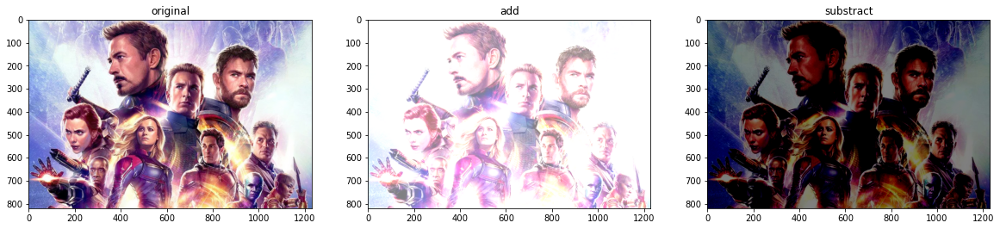

In [13]:
#相加與相減

%matplotlib inline
import cv2 
import numpy as np
from matplotlib import pyplot as plt

img1 = cv2.imread('./files/image.jpg')
mask = np.full(img1.shape, 128).astype(np.uint8)

add_result = cv2.add(img1, mask)

sub_result = cv2.subtract(img1, mask)

plt.figure(figsize=(20,10))
plt.subplot(131)
plt.imshow(img1[:,:,::-1])
plt.title('original')

plt.subplot(132)
plt.imshow(add_result[:,:,::-1])
plt.title('add')

plt.subplot(133)
plt.imshow(sub_result[:,:,::-1])
plt.title('substract')


(820, 1230, 3)
(739, 600, 3)
(739, 600, 3)


(<AxesSubplot:title={'center':'Res'}>,
 Text(0.5, 1.0, 'Res'))

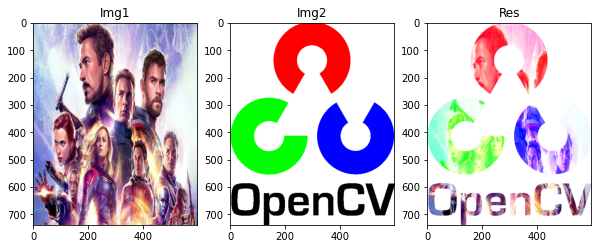

In [14]:
#相加

%matplotlib inline
import cv2 
import numpy as np
from matplotlib import pyplot as plt

img1 = cv2.imread('./files/image.jpg')
img2 = cv2.imread('./files/OpenCV_Logo.png')

print(img1.shape)
print(img2.shape)

width = int(img2.shape[1]) 
height = int(img2.shape[0])
dim = (width, height)


img1_re = cv2.resize(img1, dim, interpolation = cv2.INTER_AREA)
print(img1_re.shape)


cimg = cv2.add(img1_re,img2)

plt.figure(figsize=(10,10))
plt.subplot(131), plt.imshow(img1_re[:,:,::-1]), plt.title('Img1')
plt.subplot(132), plt.imshow(img2[:,:,::-1]), plt.title('Img2')
plt.subplot(133), plt.imshow(cimg[:,:,::-1]), plt.title('Res')


(<AxesSubplot:title={'center':'Res'}>,
 Text(0.5, 1.0, 'Res'))

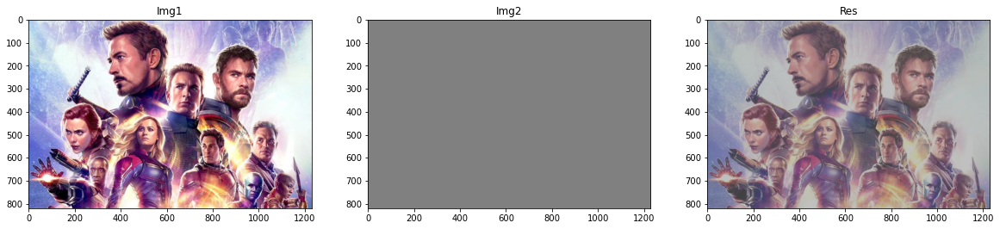

In [15]:
%matplotlib inline
import cv2 
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('./files/image.jpg')
mask = np.full(img1.shape, 128).astype(np.uint8)

img1 = img
img2 = mask

alpha = 0.5
beta = 0.5
gamma = 1

aw_res = cv2.addWeighted(img1, alpha, img2, beta, gamma)

plt.figure(figsize=(20,10))
plt.subplot(131), plt.imshow(img1[:,:,::-1]), plt.title('Img1')
plt.subplot(132), plt.imshow(img2[:,:,::-1]), plt.title('Img2')
plt.subplot(133), plt.imshow(aw_res[:,:,::-1]), plt.title('Res')


(820, 1230, 3)
(739, 600, 3)


(<AxesSubplot:title={'center':'Res'}>,
 Text(0.5, 1.0, 'Res'))

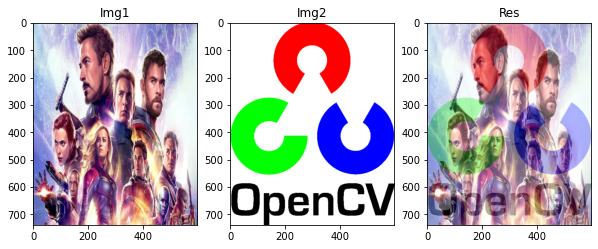

In [16]:
%matplotlib inline
import cv2 
import numpy as np
from matplotlib import pyplot as plt

img1 = cv2.imread('./files/image.jpg')
img2 = cv2.imread('./files/OpenCV_Logo.png')

print(img1.shape)
print(img2.shape)

width = int(img2.shape[1]) 
height = int(img2.shape[0])
dim = (width, height)


img1_re = cv2.resize(img1, dim, interpolation = cv2.INTER_AREA)

alpha = 0.7
beta = 0.3
gamma = 0
dst = cv2.addWeighted(img1_re, alpha, img2, beta, gamma)

plt.figure(figsize=(10,10))
plt.subplot(131), plt.imshow(img1_re[:,:,::-1]), plt.title('Img1')
plt.subplot(132), plt.imshow(img2[:,:,::-1]), plt.title('Img2')
plt.subplot(133), plt.imshow(dst[:,:,::-1]), plt.title('Res')


## 圖片的輪廓(高斯模糊、Canny) cv2.GaussianBlur, cv2.Canny

#### 1.因為彩色的圖片有三個顏色通道需要處理，但若只需找到輪廓，用一個通道即可，這樣使得在運算上不會到太複雜，因此會先將圖片轉成灰階。

#### 2.高斯模糊(高斯平滑):將圖片模糊化

`cv2.GaussianBlur(gray,(kernel_size, kernel_size), 0)`
    
kernel_size 是進行運算時，對於多大範圍的圖片進行運算。  
簡單可以理解為：如果對 5x5 的 kernel_size 運算，那圖片每一個 5x5 的中心受到高斯模糊的影響會最大，算出來就會是一張比較模糊的圖片。

Q: 為什麼要模糊?  
A: 因為先做高斯模糊(或說經過高斯平滑)的圖片能夠去除很多圖片的噪聲(雜訊)，更容易讓我們找到更精準的輪廓。

#### 3.Canny 邊緣檢測

`edges = cv2.Canny(blur_gray, low_threshold, high_threshold)`
   
其中有兩個參數需要自己依情況調整，我們知道灰階圖片的值介於 0~255 之間，情況有三種：

  - 高於 high_threshold: 為 strong edge ，我們直接保留
  - 介於 low_threshold 與 high_threshold: 為 weak edge，Canny會檢測 weak edge 是否能與 strong edge 相連，如果會相連的才會被保留。
  - 低於 low_threshold: 我們都不當作 edge

(<AxesSubplot:title={'center':'edges'}>,
 Text(0.5, 1.0, 'edges'))

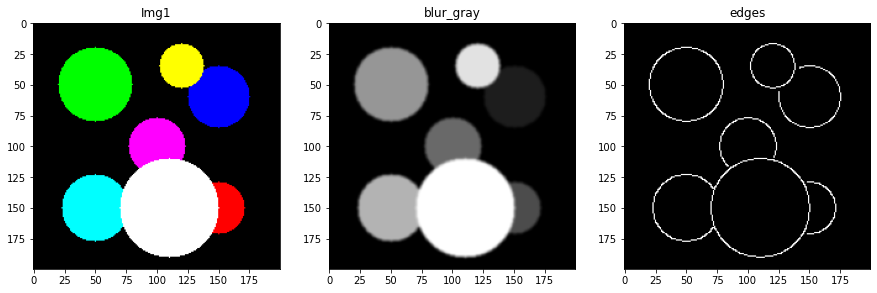

In [17]:

%matplotlib inline
import cv2 
import numpy as np
from matplotlib import pyplot as plt


shape = (200, 200, 3)
origin_img = np.zeros(shape, np.uint8)
origin_img = cv2.circle(origin_img, (50,50), color=(0,255,0) ,radius=30, thickness=-1)
origin_img = cv2.circle(origin_img, (50,150), color=(255,255,0) ,radius=27, thickness=-1)
origin_img = cv2.circle(origin_img, (100,100), color=(255,0,255) ,radius=23, thickness=-1)
origin_img = cv2.circle(origin_img, (150,60), color=(255,0,0) ,radius=25, thickness=-1)
origin_img = cv2.circle(origin_img, (150,150), color=(0,0,255) ,radius=21, thickness=-1)
origin_img = cv2.circle(origin_img, (120,35), color=(0,255,255) ,radius=18, thickness=-1)
origin_img = cv2.circle(origin_img, (110,150), color=(255,255,255) ,radius=40, thickness=-1)

gray = cv2.cvtColor(origin_img, cv2.COLOR_BGR2GRAY) # start from BGR -> gray


# 高斯模糊(高斯平滑)，與計算核心大小
kernel_size = 5
blur_gray = cv2.GaussianBlur(gray,(kernel_size, kernel_size), 0)

# Canny邊緣運算
low_threshold = 1
high_threshold = 90
edges = cv2.Canny(blur_gray, low_threshold, high_threshold)

plt.figure(figsize=(15,10))
plt.subplot(131), plt.imshow(origin_img[:,:,::-1]), plt.title('Img1')
plt.subplot(132), plt.imshow(blur_gray, cmap='gray'), plt.title('blur_gray')
plt.subplot(133), plt.imshow(edges, cmap='gray'), plt.title('edges')



(([], []), ([], []))

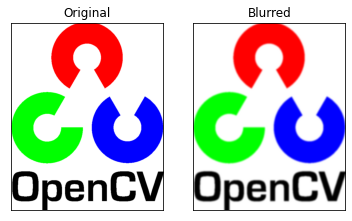

In [18]:
#高斯濾波 Gaussian Filtering

%matplotlib inline
import cv2 
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('./files/openCV_Logo.png')

blur = cv2.GaussianBlur(img, (15, 15), 0) #正奇數，數字越高照片越模糊

plt.subplot(121), plt.imshow(img[:,:,::-1]), plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur[:,:,::-1]), plt.title('Blurred')
plt.xticks([]), plt.yticks([])

(739, 600, 3)


(<AxesSubplot:title={'center':'Result'}>,
 Text(0.5, 1.0, 'Result'))

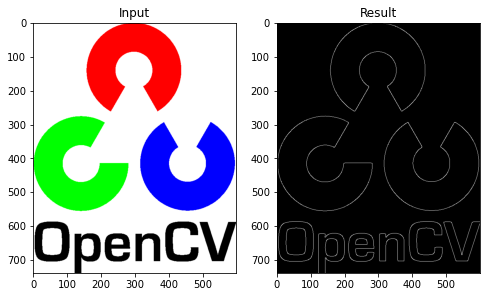

In [19]:
# 邊緣檢測

%matplotlib inline
import cv2 
import numpy as np
from matplotlib import pyplot as plt

image = cv2.imread('./files/OpenCV_Logo.png')
print(image.shape)

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

canny = cv2.Canny(blurred, 30, 150) # canny邊緣檢測，參數2、3表示最低、高閾值

plt.figure(figsize=(8,8))
plt.subplot(121), plt.imshow(image[:,:,::-1]), plt.title('Input')
plt.subplot(122), plt.imshow(canny, cmap='gray'), plt.title('Result')

(739, 600, 3)


(<AxesSubplot:title={'center':'Canny'}>,
 Text(0.5, 1.0, 'Canny'))

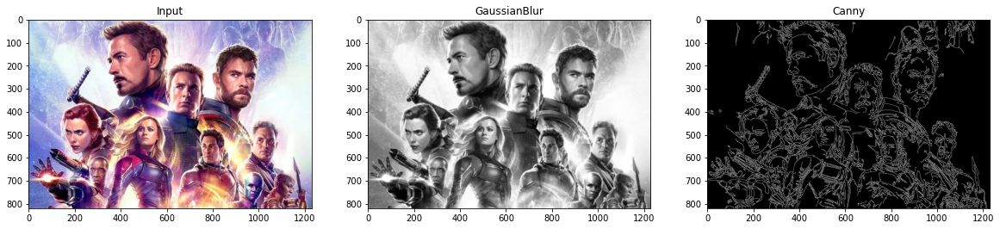

In [20]:
# 邊緣檢測

%matplotlib inline
import cv2 
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('./files/image.jpg')
print(image.shape)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (5, 5), 0)

canny = cv2.Canny(blurred, 30, 150) # canny邊緣檢測，參數2、3表示最低、高閾值

plt.figure(figsize=(20,10))
plt.subplot(131), plt.imshow(img[:,:,::-1]), plt.title('Input')
plt.subplot(132), plt.imshow(blurred, cmap='gray'), plt.title('GaussianBlur')
plt.subplot(133), plt.imshow(canny, cmap='gray'), plt.title('Canny')

## 影像平滑模糊化 blur

https://shengyu7697.github.io/python-opencv-blur/

https://www.jianshu.com/p/4ae5e8cef9ae

影像平滑模糊化是透過使用低通濾波器進行影像卷積來實現的，對於消除雜訊很有用。
實際上使用此濾波器時，它會從影像中去除高頻內容（例如，雜訊，邊緣），也會導致影像邊緣變得模糊（也有其他濾波器不會造成影像邊緣模糊）。

OpenCV主要提供四種類型的平滑模糊化技術。

- 平均濾波 Averaging： `cv2.blur` 或 `cv2.boxFilter`
- 高斯濾波 Gaussian Filtering： `cv2.GaussianBlur`
- 中值濾波 Median Filtering： `cv2.medianBlur`
- 雙邊濾波 Bilateral Filtering： `cv2.bilateralFilter`

(([], []), ([], []))

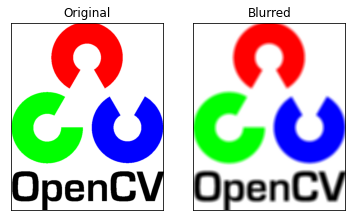

In [21]:
# 平均濾波是使用 box 濾波器進行影像卷積來完成的。它只是簡單地計算內核區域下所有像素的平均值，並用該平均值取代中心元素。
# 使用 cv2.blur 或cv2.boxFilter 


%matplotlib inline
import cv2 
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('./files/openCV_Logo.png')

blur = cv2.blur(img, (15, 15)) #內核大小為15x15，正奇數，數字越高照片越模糊

plt.subplot(121), plt.imshow(img[:,:,::-1]), plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(blur[:,:,::-1]), plt.title('Blurred')
plt.xticks([]), plt.yticks([])

## 圖片聯集bitwise_or、交集bitwise_and、互斥bitwise_xor

分別作一白色、藍色圓

- cv2.bitwise_or 圖片聯集  
`cv2.bitwise_or(img1, img2, dst=None, mask=None)`  
將兩張圖片做聯集，在這裡因為白色是 (255, 255, 255)  
藍色是(255, 0, 0)，聯集會留下白色(255, 255, 255)，只有要存在都保留。


- cv2.bitwise_and 圖片交集  
`cv2.bitwise_and(img1, img2, dst=None, mask=None)`  
將兩張圖片做交集，在這裡因為白色是 (255, 255, 255)  
藍色是(255, 0, 0)，交集會留下藍色(255, 0, 0)，一個不存在就不留。


- cv2.bitwise_xor 圖片互斥  
`cv2.bitwise_xor(img1, img2, dst=None, mask=None)`  
將兩張圖片做互斥，在這裡因為白色是 (255, 255, 255)  
藍色是(255, 0, 0)，互斥會留下黃色(0, 255, 255)，兩個都存在就不留，一個存在就留。


- cv2.bitwise_not 圖片非運算    
`cv2.bitwise_not(img1)`  
將一張圖片做非運算，在這裡因為白色是 (255, 255, 255)，非運算會留下黑色(0, 0, 0)。  
反過來說，原本黑色的地方，經過圖片非運算，會變成白色。



## P圖的操作

- 要實現把一個人P到另外一張圖，我們直接用 addWeighted 是行不通的，因為 addWeighted 只有調整透明度後貼上去，  
  因此貼上去的圖片原本的背景一定還在。


- 那想P圖應該怎麼做呢?  
  先將圖片做「二值化」(之後的內容會提到，簡單來說將圖片變為黑白色)。把要挖掉的地方先用成黑色，會用到`cv2.bitwise_not`  
  使用 `cv2.bitwise_and` 挖掉該區域 (因為黑色=0全挖空，白色=255全保留)，  
  再用 `cv2.add` 將圖片貼上該空白(被挖掉的)區域 (因為黑色=0，相加沒影響)


(<AxesSubplot:title={'center':'img1_NOT'}>,
 Text(0.5, 1.0, 'img1_NOT'))

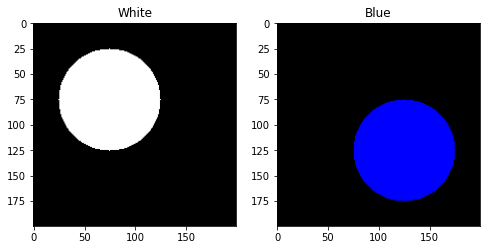

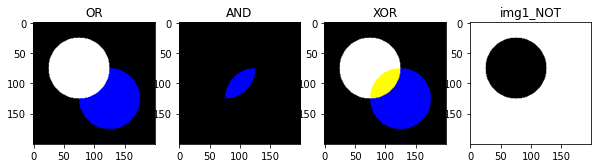

In [22]:

%matplotlib inline
import cv2 
import numpy as np
from matplotlib import pyplot as plt

imgw = np.zeros((200, 200, 3), dtype = "uint8")
white = cv2.circle(imgw , (75,75), radius=50, color=(255,255,255), thickness=-1)
imgb = np.zeros((200, 200, 3), dtype = "uint8")
blue = cv2.circle(imgb , (125,125), radius=50, color=(255,0,0), thickness=-1)

img1 = white
img2 = blue

img1_img2_or = cv2.bitwise_or(img1, img2, dst=None, mask=None)
img1_img2_and = cv2.bitwise_and(img1, img2, dst=None, mask=None)
img1_img2_xor = cv2.bitwise_xor(img1, img2, dst=None, mask=None)
img1_not = cv2.bitwise_not(img1)


plt.figure(figsize=(8,8))
plt.subplot(121), plt.imshow(img1[:,:,::-1]), plt.title('White')
plt.subplot(122), plt.imshow(img2[:,:,::-1]), plt.title('Blue')

plt.figure(figsize=(10,10))
plt.subplot(141), plt.imshow(img1_img2_or[:,:,::-1]), plt.title('OR')
plt.subplot(142), plt.imshow(img1_img2_and[:,:,::-1]), plt.title('AND')
plt.subplot(143), plt.imshow(img1_img2_xor[:,:,::-1]), plt.title('XOR')
plt.subplot(144), plt.imshow(img1_not[:,:,::-1]), plt.title('img1_NOT')


## 影像二值化與閾值thresholding

https://www.jianshu.com/p/3a94020bc1ac

https://shengyu7697.github.io/python-opencv-threshold/

影像二值化的方法:

1. Simple Thresholding

如果像素值pixel大於閾值(門檻值)threshold，就指定一個新數值(例如白色)，否則就指定另一個新數值(例如黑色)。
cv2.threshold 最主要的功能是能夠幫助我們將一張圖片做二值化，二值化的意思是圖片只會剩下兩個值，通常是黑(255)與白(0)。


為什麼我們需要做二值化呢?  
圖片二值化後，對於整張圖片來說就是乾淨的兩個值，只有乾淨的兩個值，很適合我們做一些輪廓偵測的運算。  
而算出輪廓後我們就可以做很多圖形的處理，例如畫出圖片輪廓、圖片邊緣的銳利度強化、加粗圖片的輪廓線、依照輪廓線替圖片添加陰影...  
搭配其他功能的操作能實現非常多的效果！

`ret, dst = cv2.threshold(src, thresh, maxval, type)`

- src:「灰階」原圖
- dst:輸出圖
- maxVal:最大灰階值，一般為255
- type:為二值化類型
   - `cv2.THRESH_BINARY`：Threshold Binary，即二值化，將大於門檻值的灰階值設為最大灰階值，小於門檻值的值設為0。
   - `cv2.THRESH_BINARY_INV`：Threshold Binary, Inverted，將大於門檻值的灰階值設為0，其他值設為最大灰階值。
   - `cv2.THRESH_TRUNC`：Truncate，將大於門檻值的灰階值設為門檻值，小於門檻值的值保持不變。
   - `cv2.THRESH_TOZERO`：Threshold to Zero，將小於門檻值的灰階值設為0，大於門檻值的值保持不變。
   - `cv2.THRESH_TOZERO_INV`：Threshold to Zero, Inverted，將大於門檻值的灰階值設為0，小於門檻值的值保持不變。
   
| 編號   | 閾值|
|:-----:|:-----:|
|1	|THRESH_BINARY|
|2	|THRESH_BINARY_INV|
|3	|THRESH_TRUNC|
|4	|THRESH_TOZERO|
|5	|THRESH_TOZERO_INV|
|6	|THRESH_MASK|
|7	|THRESH_OTSU|
|8|	THRESH_TRIANGLE|

參考這張圖 https://docs.opencv.org/2.4/_images/threshold.png


以下範例使用參數：
- cv2.THRESH_BINARY  
  將小於閾值的灰度值設為0，其他值設為最大灰度值。即是：>127 =255, <127 =0
- cv2.THRESH_BINARY_INV  
  將大於閾值的灰度值設為0，其他值設為最大灰度值。即是：>127 =0, <127 =255
- cv2.THRESH_TRUNC  
  將大於閾值的灰度值設為閾值，小於閾值的值保持不變。即是：>127 =127
- cv2.THRESH_TOZERO  
  將小於閾值的灰度值設為0，大於閾值的值保持不變。即是：<127 =0
- cv2.THRESH_TOZERO_INV  
  將大於閾值的灰度值設為0，小於閾值的值保持不變。即是：>127 =0


(400, 400)


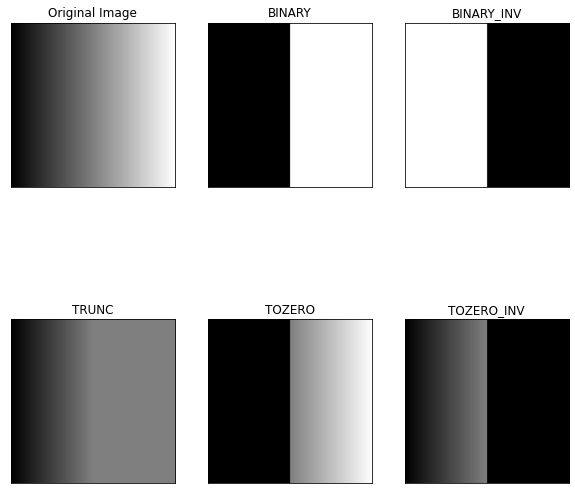

In [23]:
# thresholding
%matplotlib inline
import cv2
import numpy as np
import matplotlib.pyplot as plt

row = 400
col = 400

img = np.zeros((row, col), dtype = "uint8") + np.linspace(0, 255, 400)
print(img.shape)

# 將小於閾值的灰度值設為0，其他值設為最大灰度值。>127 =255, <127 =0
ret,thresh1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)

# 將大於閾值的灰度值設為0，其他值設為最大灰度值。>127 =0, <127 =255
ret,thresh2 = cv2.threshold(img,127,255,cv2.THRESH_BINARY_INV)

# 將大於閾值的灰度值設為閾值，小於閾值的值保持不變。 >127 =127
ret,thresh3 = cv2.threshold(img,127,255,cv2.THRESH_TRUNC)

# 將小於閾值的灰度值設為0，大於閾值的值保持不變。 <127 =0
ret,thresh4 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO)

# 將大於閾值的灰度值設為0，小於閾值的值保持不變。 >127 =0
ret,thresh5 = cv2.threshold(img,127,255,cv2.THRESH_TOZERO_INV)


titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img, thresh1, thresh2, thresh3, thresh4, thresh5]

plt.figure(figsize=(10,10))
for i in range(6):
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray',vmin=0,vmax=255)
    plt.title(titles[i])
    plt.xticks([]),plt.yticks([])

(820, 1230, 3)


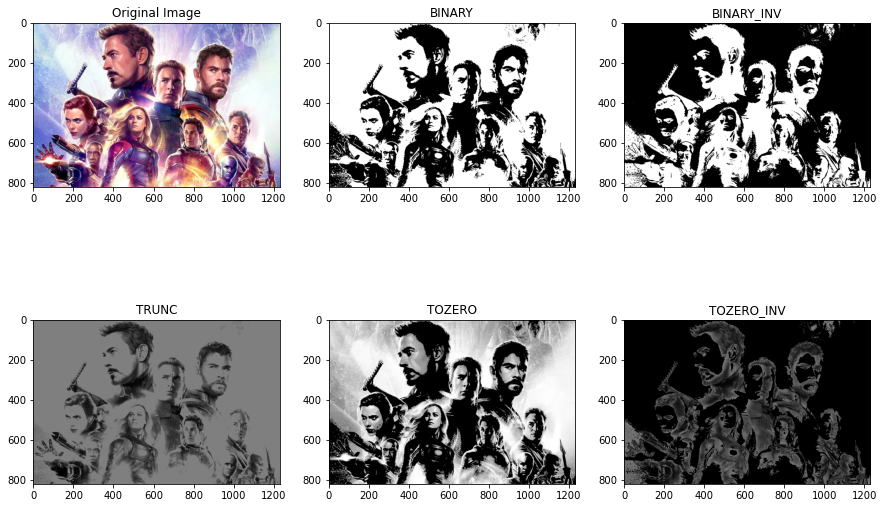

In [25]:

%matplotlib inline
import cv2 
import numpy as np
from matplotlib import pyplot as plt

img = cv2.imread('./files/image.jpg')


gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

print(img.shape)

# 將小於閾值的灰度值設為0，其他值設為最大灰度值。>127 =255, <127 =0
ret,thresh1 = cv2.threshold(gray,127,255,cv2.THRESH_BINARY)

# 將大於閾值的灰度值設為0，其他值設為最大灰度值。>127 =0, <127 =255
ret,thresh2 = cv2.threshold(gray,127,255,cv2.THRESH_BINARY_INV)

# 將大於閾值的灰度值設為閾值，小於閾值的值保持不變。 >127 =127
ret,thresh3 = cv2.threshold(gray,127,255,cv2.THRESH_TRUNC)

# 將小於閾值的灰度值設為0，大於閾值的值保持不變。 <127 =0
ret,thresh4 = cv2.threshold(gray,127,255,cv2.THRESH_TOZERO)

# 將大於閾值的灰度值設為0，小於閾值的值保持不變。 >127 =0
ret,thresh5 = cv2.threshold(gray,127,255,cv2.THRESH_TOZERO_INV)


titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [img[:,:,::-1], thresh1, thresh2, thresh3, thresh4, thresh5]

plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1),plt.imshow(images[i],'gray',vmin=0,vmax=255)
    plt.title(titles[i])
    #plt.xticks([]),plt.yticks([])

2.自適應二值化，產生更好效果的黑白圖片 cv2.adaptiveThreshold

一般的「二值化」只會考慮單一點的值，直接去做閥值分析，
但一張圖片的「每個鄰近的像素都是彼此有關連的」，如果單純只針對單一個點去看，似乎失去了對整張圖相鄰點的考慮，
因此「自適應二值化」就是在幫助我們找到單一點與鄰近區域的關係。

自適應的二值化又分為
- 算術平均法的自適應二值化: `cv2.ADAPTIVE_THRESH_MEAN_C`，取的是「區域平均值」減去常數C
- 高斯加權均值法自適應二值化: `cv2.ADAPTIVE_THRESH_GAUSSIAN_C`，取的是「高斯平均值」(高斯分佈)減去常數C



`cv2.adaptiveThreshold(image, 255, 自適應二值化算法, 閥值類型, 參考局部大小, 偏移量)`
 - image: 輸入圖片
 - 自適應二值化算法: 可使用 cv2.ADAPTIVE_THRESH_MEAN_C 和 cv2.ADAPTIVE_THRESH_GAUSSIAN_C
 - 閥值類型: 可使用 THRESH_BINARY 和 THRESH_BINARY_INV，看是超過閥值要「黑白」還是「白黑」。
 - 參考局部大小: 就是參考區域的大小
 - 偏移量C: 微調用的參數


自適應二值化，搭配模糊降噪，能有更好的效果。  
通常在做「自適應二值化」之前，我們都會先將圖片做模糊化，能夠達到降噪的效果，看下圖結果的圖片應該能很明顯地分得出差別。


(820, 1230, 3)


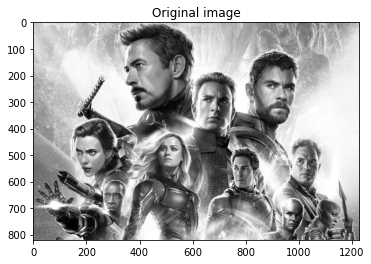

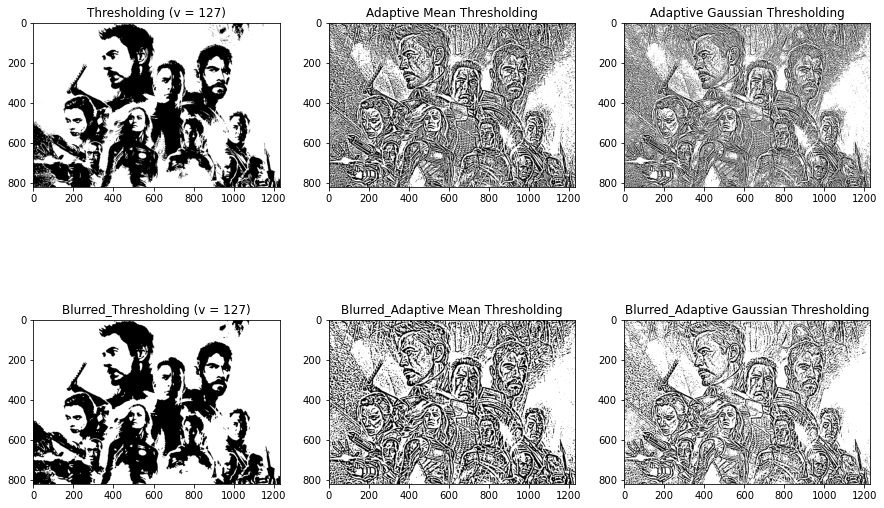

In [26]:
# adaptive thresholding
%matplotlib inline
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt


img = cv2.imread('./files/image.jpg')
print(img.shape)

# 先將圖片轉為灰階
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 

# 將圖片做模糊化，可以降噪
blur_img = cv2.medianBlur(img,5)

# 一般圖二值化(未模糊降噪)
ret,th1 = cv2.threshold(img,127,255, cv2.THRESH_BINARY)

# 一般圖自適應平均二值化(未模糊降噪)
th2 = cv2.adaptiveThreshold(img,255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,11,2)

# 一般圖自適應高斯二值化(未模糊降噪)
th3 = cv2.adaptiveThreshold(img,255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)

# 一般圖二值化(有模糊降噪)
ret, th4 = cv2.threshold(blur_img,127,255,cv2.THRESH_BINARY)

# 一般圖算術平均法的自適應二值化(有模糊降噪)
th5 = cv2.adaptiveThreshold(blur_img,255,cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,11,2)
        
# 一般圖高斯加權均值法自適應二值化(有模糊降噪)      
th6 = cv2.adaptiveThreshold(blur_img,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,11,2)

titles = ['Original Image', 'Thresholding (v = 127)',
            'Adaptive Mean Thresholding', 'Adaptive Gaussian Thresholding', 'Blurred_Thresholding (v = 127)',
            'Blurred_Adaptive Mean Thresholding', 'Blurred_Adaptive Gaussian Thresholding']
images = [img, th1, th2, th3, th4, th5, th6]



plt.figure()
plt.imshow(img, 'gray')
plt.title('Original image')

plt.figure(figsize=(15,10))
for i in range(6):
    plt.subplot(2,3,i+1)
    plt.imshow(images[i+1],'gray')
    plt.title(titles[i+1])
    #plt.xticks([]),plt.yticks([])

## Otsu's Threshold 大津二值化，自動計算最佳閥值，做出最好的黑白效果圖

- Otsu's Threshold 大津二值化，用來幫助我們解決「手動設定閥值的選值困擾」，透過 Otsu's Threshold 演算法，能夠「自動找出最佳的閥值」。


- Otsu's Threshold 的使用
  有時會先搭配模糊的方法先進行降噪。  
`ret, th = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)`

(<AxesSubplot:title={'center':"Blurred_Otsu's thresholding"}>,
 Text(0.5, 1.0, "Blurred_Otsu's thresholding"))

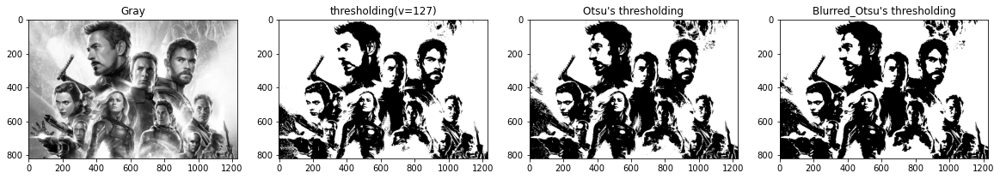

In [27]:
%matplotlib inline
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt


img = cv2.imread('./files/image.jpg')

# 先將圖片轉為灰階
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) 

# global thresholding
ret1,th1 = cv2.threshold(img,127,255,cv2.THRESH_BINARY)

# Otsu's thresholding
ret2,th2 = cv2.threshold(img,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

# Otsu's thresholding after Gaussian filtering
blur = cv2.GaussianBlur(img,(5,5),0)
ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)


plt.figure(figsize=(20,15))
plt.subplot(141), plt.imshow(img, 'gray'), plt.title('Gray')
plt.subplot(142), plt.imshow(th1, 'gray'), plt.title('thresholding(v=127)')
plt.subplot(143), plt.imshow(th2, 'gray'), plt.title('Otsu\'s thresholding')
plt.subplot(144), plt.imshow(th3, 'gray'), plt.title('Blurred_Otsu\'s thresholding')

## 漫水填充法 cv2.floodFill (Magic Wand Tool)

- 類似 photoshop 魔術棒工具的函數，稱為「漫水填充法」 cv2.floodFill  
  原理是從一個點的資訊出發，開始尋找鄰近點是否有與他相似的值，如果有，則填充一樣的顏色，最後我們可以再利用此顏色進行其他修圖。


- cv2.floodFill 的函數定義  
  `cv2.floodFill(image, mask, seedPoint, newVal, loDiff, upDiff, flags)`  
  
  - image: 圖
  - mask: 遮罩，預設為「原圖的大小長寬各+2」
  - seedPoint: 種子點 (顏色對照點)
  - newVal: 要填充的顏色
  - loDiff: 與種子點顏色之負向顏色差距最大值
  - upDiff: 與種子點顏色之正向顏色差距最大值
  - flags: 可以分為  
       - `FLOODFILL_MASK_ONLY`: 設定則表示不改變原始圖片(等於忽略newVal的值)，結果會改變在mask裡面
       - `FLOODFILL_FIXED_RANGE`: 設定這個表示考慮當前像素與種子點的差，沒有則代表都與鄰近的比
       以上兩個參數可以用 or 相連表示同時使用: 即 FLOODFILL_MASK_ONLY | FLOODFILL_FIXED_RANGE


In [ ]:
def floodfill(img, seed=(0, 0), loDiff=40, upDiff=30):
    copyimg = img.copy()
    h, w = img.shape[:2]
    mask = np.zeros([h+2, w+2], np.uint8) 
    cv2.floodFill(copyimg, mask, seed, (0, 0, 0), (loDiff, loDiff, loDiff), (upDiff, upDiff, upDiff),
                  cv2.FLOODFILL_FIXED_RANGE) 

(<AxesSubplot:title={'center':'floodfill_reverse'}>,
 Text(0.5, 1.0, 'floodfill_reverse'))

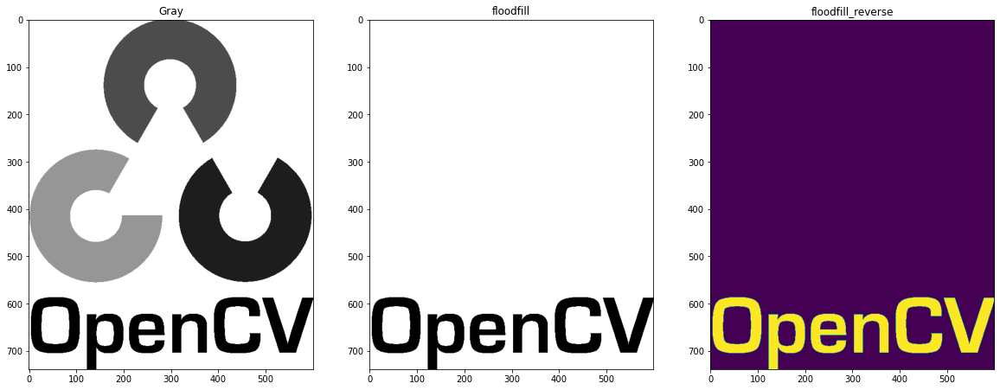

In [28]:

%matplotlib inline
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt


#img = cv2.imread('./files/image.jpg')
img = cv2.imread('./files/openCV_Logo.png')
# 先將圖片轉為灰階

img2gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
#一開始填充值都設黑色(0,0,0)，
#在二值化時，只需要將閥值設1 (1>0) 即可得到過濾物
ret, th = cv2.threshold(img2gray, 1, 255, cv2.THRESH_BINARY)


seed=(0, 0)
loDiff=40 
upDiff=30
h, w = img.shape[:2]
mask2 = np.zeros([h+2, w+2], np.uint8) 
cv2.floodFill(th, mask2, seed, (255, 255, 255), (loDiff, loDiff, loDiff), 
               (upDiff, upDiff, upDiff), cv2.FLOODFILL_FIXED_RANGE) 

mask_inv = cv2.bitwise_not(th)

plt.figure(figsize=(20,15))
plt.subplot(131), plt.imshow(img2gray, 'gray'), plt.title('Gray')
plt.subplot(132), plt.imshow(th, 'gray'), plt.title('floodfill')
plt.subplot(133), plt.imshow(mask_inv), plt.title('floodfill_reverse')

## P圖，合併merge two images

步驟：
1. 將要P的圖，改成適當大小 (cv2.resize)
2. 將要P的圖，使用漫水填充法，濾出背景 (cv2.floodFill)
3. 將濾出背景的圖，挖出人物，取得遮罩(黑色) (cv2.cvtColor, cv2.threshold)
4. 將遮罩印在原來的圖片上，有點像挖空的感覺 (cv2.bitwise_and)
5. 挖空後，反向取得原先要P圖的人物 (cv2.bitwise_not, cv2.bitwise_and)
6. 合併人物至原來的圖片 (cv2.add)

(<matplotlib.image.AxesImage at 0x7fafa8d6e760>, Text(0.5, 1.0, 'Final'))

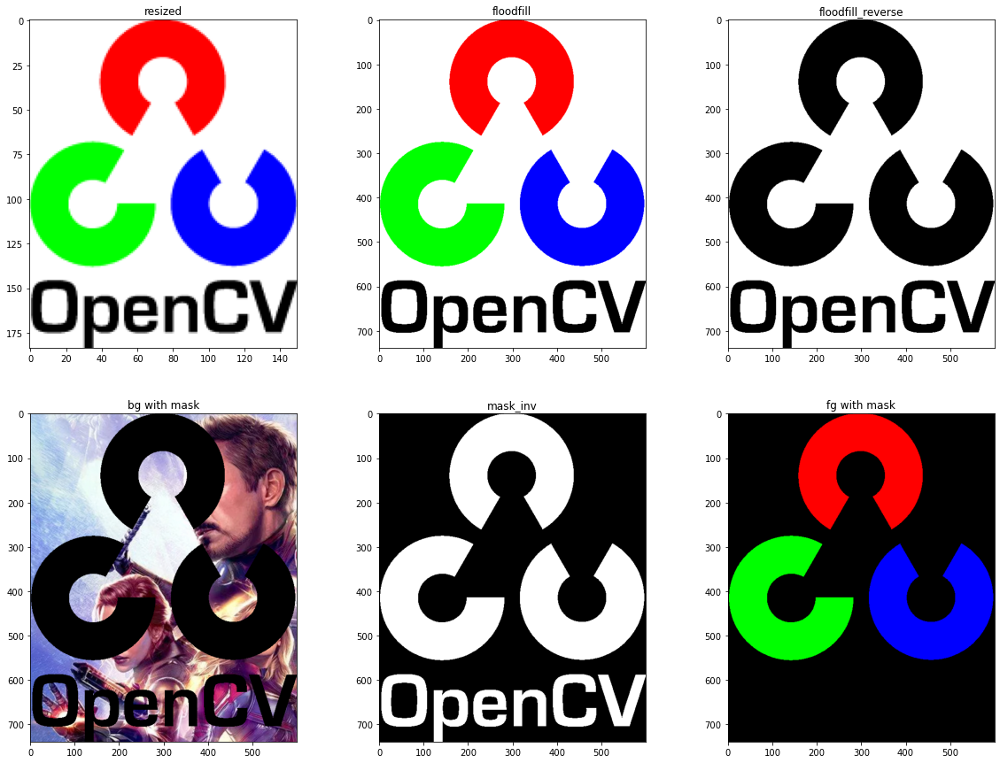

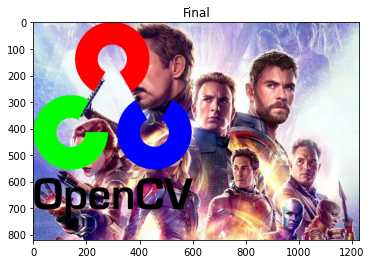

In [29]:
%matplotlib inline
import cv2 
import numpy as np
from matplotlib import pyplot as plt

img1 = cv2.imread('./files/image.jpg')     #底圖
img2 = cv2.imread('./files/OpenCV_Logo.png') #要P上的圖



#1、將要P的圖，改成適當大小 (cv2.resize)
scale_percent= 25
width = int(img2.shape[1] * scale_percent / 100) # 縮放後圖片寬度
height = int(img2.shape[0] * scale_percent / 100) # 縮放後圖片高度
dim = (width, height) # 圖片形狀 
resize_img2 = cv2.resize(img2, dim, interpolation = cv2.INTER_AREA)  

plt.figure(figsize=(20,15))
plt.subplot(2,3,1)
plt.imshow(resize_img2[:,:,::-1]), plt.title('resized')
    
#2、將要P的圖，使用漫水填充法，濾出背景 (cv2.floodFill)
copyIma = img2.copy()
h, w = img2.shape[:2]
mask = np.zeros([h+2, w+2], np.uint8)
cv2.floodFill(copyIma, mask, (30, 30), (255, 255, 255), (100, 100, 100), (50, 50, 50), cv2.FLOODFILL_FIXED_RANGE) 
plt.subplot(2,3,2)
plt.imshow(copyIma[:,:,::-1]), plt.title('floodfill')

#3、將濾出背景的圖，挖出人物，取得遮罩(黑色) (cv2.cvtColor, cv2.threshold)
img2gray = cv2.cvtColor(copyIma,cv2.COLOR_BGR2GRAY)
ret, mask = cv2.threshold(img2gray, 254, 255, cv2.THRESH_BINARY)
    #取得上面的漫水填充法結果圖後，我們一樣先轉成灰階，由於剛剛我們使用 (255, 255, 255) 來填充背景部分，
    #我們設定閥值(threshold)為 254，濾出背景。
    #最後我們要取得遮罩，等等要拿來挖空原圖，遮罩有點類似就是要挖空的形狀，所以我們把挖空的地方填成黑色
plt.subplot(2,3,3)
plt.imshow(mask, 'gray'), plt.title('floodfill_reverse')


#4、將遮罩印在原來的圖片上，有點像挖空的感覺 (cv2.bitwise_and)
rows, cols, channels = img2.shape
x = 0 
y = 0
roi = img1[y:y+rows, x:x+cols]

img1_bg = cv2.bitwise_and(roi, roi, mask = mask)
    #先透過 roi 設定好我們想p圖的位置，之後直接把這區域先取出來，然後使用 cv2.bitwise_and 直接進行挖空，
    #因為mask黑色部分是0，只要and之後都會是黑，而白色部分是255，只要and之後都會保持原樣。
plt.subplot(2,3,4)
plt.imshow(img1_bg[:,:,::-1]), plt.title('bg with mask')


#5、挖空後，反向操作取得原先要P圖的人物 (cv2.bitwise_not, cv2.bitwise_and)
mask_inv = cv2.bitwise_not(mask)
img2_fg = cv2.bitwise_and(img2, img2, mask = mask_inv)
    #用cv2.bitwise_and 要p的圖片，先將原來的mask運用 cv2.bitwise_not，取得反向的mask，變成這個mask專門來幫助挖掉背景。
    #因為mask黑色部分(現在是背景)是0，只要and之後都會是黑，而白色部分是255(現在是人)，只要and之後都會保持原樣。
plt.subplot(2,3,5)
plt.imshow(mask_inv,'gray'), plt.title('mask_inv')
plt.subplot(2,3,6)
plt.imshow(img2_fg[:,:,::-1]), plt.title('fg with mask')


#6、合併人物至原來的圖片 (cv2.add)
dst = cv2.add(img1_bg,img2_fg)
img1[y:y+rows, x:x+cols] = dst
    #在步驟4，我們已經把原圖要p的地方挖空(=0)
    #在步驟5，我們已經把要p的地方取出(有乾淨的值)，其他背景(=0)
    #我們只需要將這兩個單純相加 (=0的地方已經不構成影響)，即可以得到乾淨的合成圖片。
    #使用 cv2.add。最後只要合併結果至原圖，p圖就完成囉

plt.figure()
plt.imshow(img1[:,:,::-1]), plt.title('Final')

## 人臉、人眼偵測

https://ithelp.ithome.com.tw/articles/10251665

1. 特徵分類器為一個XML檔，安裝OpenCV時同時放入，要找到路徑，或是複製到指定路徑PATH
- 人臉辨識 `faceCascade = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')`
- 人眼辨識 `eyesCascade = cv2.CascadeClassifier('haarcascade_eye_tree_eyeglasses.xml')`

2. 偵測圖片
- `faces = faceCascade.detectMultiScale(
    grayimg,
    scaleFactor=1.1,
    minNeighbors=5,
    minSize=(30, 30),
    flags = cv2.CV_HAAR_SCALE_IMAGE
)` 
  - detectMultiScale為偵測特徵的功能
  - grayimg是灰階圖片
  - scaleFactor圖像縮放比例，類似相機X倍鏡頭
  - minNeighbors針對特徵點附近進行檢測
  - minSize特徵檢測點的最小尺寸
       scaleFactor、minNeighbors、minSize數值大小將影響辨識結果，須依狀況進行調整

- `eyes = eyesCascade.detectMultiScale(grayimg)`


3. 框出人臉與眼：

for (x, y, w, h) in faces:
     
     cv2.rectangle(img, (x, y), (x + w, y + h), color=(0, 255, 0), thickness=2) #畫矩形 
     
     for (x2,y2,w2,h2) in eyes:
                eye_center = (x + x2 + w2//2, y + y2 + h2//2)  
                radius = int(round((w2 + h2)*0.25))
                cv2.circle(img, eye_center, radius, (255, 0, 0 ), 4) #畫圓


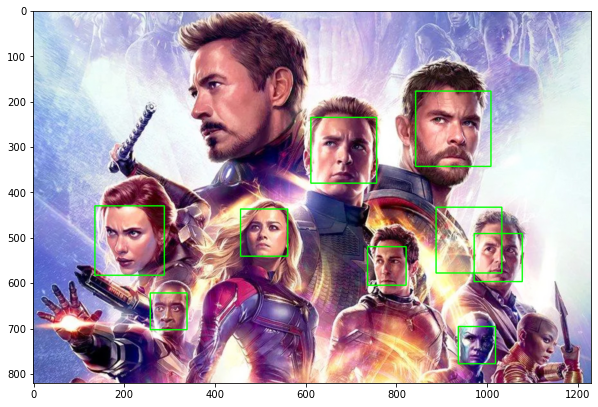

In [30]:
%matplotlib inline
import cv2 
import numpy as np
from matplotlib import pyplot as plt


PATH = './files/haarcascade_frontalface_default.xml'

def detectFace(img):
    filename = img.split(".")[0] # 取得檔案名稱(不添加副檔名)
    img = cv2.imread(img) # 讀取圖檔
    grayImg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # 透過轉換函式轉為灰階影像
    color = (0, 255, 0)  # 定義框的顏色
    
    # 人臉識別分類器
    face_classifier = cv2.CascadeClassifier(PATH)

    # 調用偵測識別人臉函式
    faceRects = face_classifier.detectMultiScale(grayImg, scaleFactor=1.2, minNeighbors=5, minSize=(30, 30))
    # 大於 0 則檢測到人臉
    if len(faceRects):  
        # 框出每一張人臉
        for faceRect in faceRects: 
            x, y, w, h = faceRect
            cv2.rectangle(img, (x, y), (x + h, y + w), color, 2)
    
    # 將結果圖片輸出
    #cv2.imwrite(filename + "_face.jpg", img)
    return img
    
plt.figure(figsize=(10,10))
plt.imshow(detectFace('./files/image.jpg')[:,:,::-1])



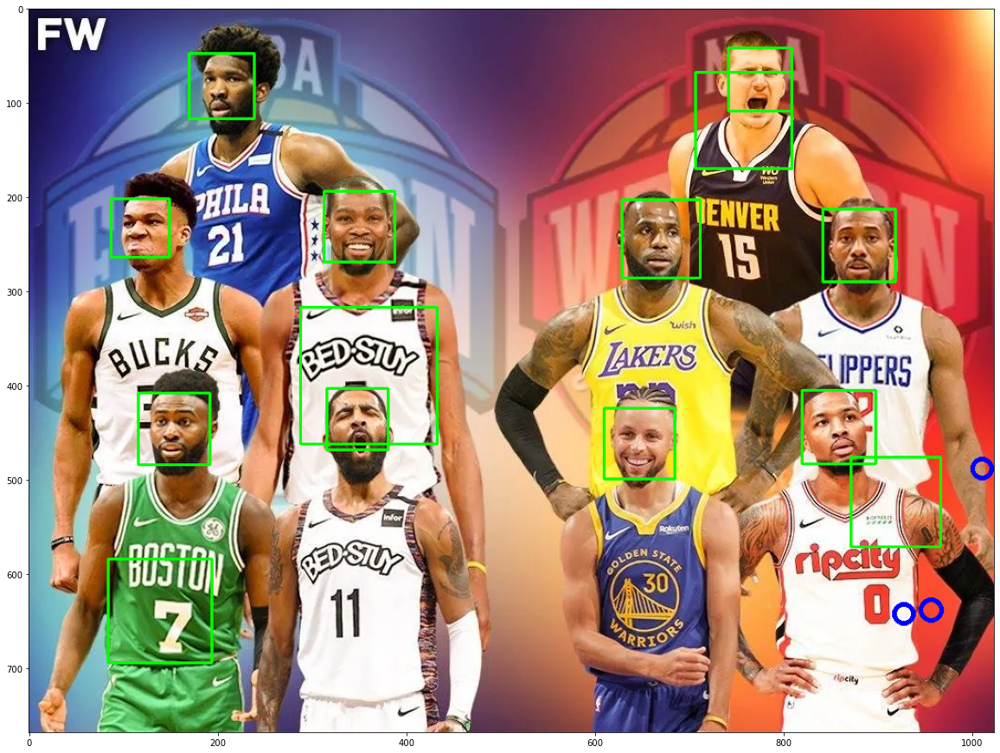

In [31]:
%matplotlib inline
import cv2 
import numpy as np
from matplotlib import pyplot as plt


PATH_F = './files/haarcascade_frontalface_default.xml'
PATH_E = './files/haarcascade_eye_tree_eyeglasses.xml'

def detectFace_Eyes(img):
    filename = img.split(".")[0] # 取得檔案名稱(不添加副檔名)
    img = cv2.imread(img) # 讀取圖檔
    grayImg = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # 透過轉換函式轉為灰階影像
    color = (0, 255, 0)  # 定義框的顏色
    
    # 人臉、人眼辨識分類器
    face_classifier = cv2.CascadeClassifier(PATH_F)
    eye_classifier = cv2.CascadeClassifier(PATH_E)
    
    # 調用偵測識別人臉函式
    #faceRects = face_classifier.detectMultiScale(grayImg, scaleFactor=1.5, minNeighbors=2, minSize=(10, 10))
    faceRects = face_classifier.detectMultiScale(grayImg)
    eyes = eye_classifier.detectMultiScale(grayImg)
    
   
    if len(faceRects):  
        # 框出每一張人臉
        for faceRect in faceRects: 
            x, y, w, h = faceRect
            cv2.rectangle(img, (x, y), (x + h, y + w), color, 2)
    
            # 框出每一個眼睛
            for (x2,y2,w2,h2) in eyes:
                eye_center = (x + x2 + w2//2, y + y2 + h2//2)
                radius = int(round((w2 + h2)*0.25))
                cv2.circle(img, eye_center, radius, (255, 0, 0 ), 4)

    return img
    
plt.figure(figsize=(20,20))
plt.imshow(detectFace_Eyes('./files/NBA_ALLSTAR2021.jpg')[:,:,::-1])


# 影片

In [ ]:
# 視訊鏡頭影像

import cv2
# 選擇第二隻攝影機（0 代表第一隻、1 代表第二隻）
cap = cv2.VideoCapture(1)
while(True):
  # 從攝影機擷取一張影像
  ret, frame = cap.read()
  # 顯示圖片
  cv2.imshow('frame', frame)
  # 若按下 q 鍵則離開迴圈
  if cv2.waitKey(1) & 0xFF == ord('q'):
    break
# 釋放攝影機
cap.release()
# 關閉所有 OpenCV 視窗
cv2.destroyAllWindows()

In [ ]:
#影片相關資訊
import cv2
cap = cv2.VideoCapture(1)
# 解析 Fourcc 格式資料的函數
def decode_fourcc(v):
    v = int(v)
    return "".join([chr((v >> 8 * i) & 0xFF) for i in range(4)])
# 取得影像的尺寸大小
width = cap.get(cv2.CAP_PROP_FRAME_WIDTH)
height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
print("Image Size: %d x %d" % (width, height))
# 取得 Codec 名稱
fourcc = cap.get(cv2.CAP_PROP_FOURCC)
codec = decode_fourcc(fourcc)
print("Codec: " + codec)
cap.release()

In [ ]:
#變更影片解析度
import cv2
cap = cv2.VideoCapture(1)
# 設定影像的尺寸大小
cap.set(cv2.CAP_PROP_FRAME_WIDTH, 1280)
cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 960)
while(True):
    ret, frame = cap.read()
    cv2.imshow('frame', frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

In [ ]:
#讀取影片檔案
import cv2
# 開啟影片檔案
cap = cv2.VideoCapture('my_video.avi')
# 以迴圈從影片檔案讀取影格，並顯示出來
while(cap.isOpened()):
    ret, frame = cap.read()
    cv2.imshow('frame',frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
cap.release()
cv2.destroyAllWindows()

In [ ]:
#寫入影片檔案
import cv2
cap = cv2.VideoCapture(1)
# 設定擷取影像的尺寸大小
cap.set(cv2.CAP_PROP_FRAME_WIDTH, 640)
cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 360)
# 使用 XVID 編碼
fourcc = cv2.VideoWriter_fourcc(*'XVID')
#影片常見編碼格式：DIVX、XVID、MJPG、X264、WMV1、WMV2
# 建立 VideoWriter 物件，輸出影片至 output.avi
# FPS 值為 20.0，解析度為 640x360
out = cv2.VideoWriter('output.avi', fourcc, 20.0, (640, 360))
while(cap.isOpened()):
    ret, frame = cap.read()
    if ret == True:
      # 寫入影格
        out.write(frame)
        cv2.imshow('frame',frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break
    else:
        break
# 釋放所有資源
cap.release()
out.release()
cv2.destroyAllWindows()